# Troubleshooting Whole-Well Merge Approach

## Imports

In [1]:
import pandas as pd
import numpy as np
import yaml
import matplotlib.pyplot as plt
from lib.merge.eval_merge import *

## QC of stitch_configs

### Check Stitch configs
This will check that coordinates have been computed for all tiles and will display how the tiles will be arranged. It will check circular geometry and also estimate the size of the final stitched image.

In [2]:
# Load the new stitch configs
with open('/lab/ops_analysis/lourido/nebo-analysis/analysis/analysis_root/merge/stitch_configs/P-1_W-B2__phenotype_stitch_config.yml', 'r') as f:
    phenotype_config = yaml.safe_load(f)

with open('/lab/ops_analysis/lourido/nebo-analysis/analysis/analysis_root/merge/stitch_configs/P-1_W-B2__sbs_stitch_config.yml', 'r') as f:
    sbs_config = yaml.safe_load(f)

# Load metadata for comparison
phenotype_metadata = pd.read_parquet('/lab/ops_analysis/lourido/nebo-analysis/analysis/analysis_root/preprocess/metadata/phenotype/P-1_W-B2__combined_metadata.parquet')
sbs_metadata = pd.read_parquet('/lab/ops_analysis/lourido/nebo-analysis/analysis/analysis_root/preprocess/metadata/sbs/P-1_W-B2__combined_metadata.parquet')


# Analyze both configs
print("🔍 Verifying Stitch Configs Preserve Circular Geometry")

phenotype_analysis = analyze_stitch_config(phenotype_config, phenotype_metadata, 'B2', 'phenotype')
sbs_analysis = analyze_stitch_config(sbs_config, sbs_metadata, 'B2', 'sbs')

# Summary
print(f"\n📋 SUMMARY:")
print(f"Phenotype config: {len(phenotype_config['total_translation'])} shifts computed")
print(f"SBS config: {len(sbs_config['total_translation'])} shifts computed")

# Check if the shifts will create reasonable output sizes
def estimate_output_size(shifts, tile_size):
    """Estimate final stitched image size"""
    if not shifts:
        return tile_size
    
    y_shifts = [shift[0] for shift in shifts.values()]
    x_shifts = [shift[1] for shift in shifts.values()]
    
    max_y = max(y_shifts) if y_shifts else 0
    max_x = max(x_shifts) if x_shifts else 0
    
    return (max_y + tile_size[0], max_x + tile_size[1])

pheno_size = estimate_output_size(phenotype_config['total_translation'], (2400, 2400))
sbs_size = estimate_output_size(sbs_config['total_translation'], (1200, 1200))

print(f"\nEstimated Stitched Image Sizes:")
print(f"  Phenotype: {pheno_size[0]} × {pheno_size[1]} ({pheno_size[0] * pheno_size[1] / 1e9:.1f} gigapixels)")
print(f"  SBS: {sbs_size[0]} × {sbs_size[1]} ({sbs_size[0] * sbs_size[1] / 1e9:.1f} gigapixels)")

# Memory estimates
pheno_memory_gb = pheno_size[0] * pheno_size[1] * 2 / 1e9  # uint16
sbs_memory_gb = sbs_size[0] * sbs_size[1] * 2 / 1e9

print(f"\nEstimated Memory Usage (uint16 images):")
print(f"  Phenotype: {pheno_memory_gb:.1f} GB")
print(f"  SBS: {sbs_memory_gb:.1f} GB")

if pheno_memory_gb > 350:
    print(f"  ⚠️  Phenotype may exceed 400GB memory limit")
if sbs_memory_gb > 350:
    print(f"  ⚠️  SBS may exceed 400GB memory limit")

print(f"\n✅ Stitch configs look ready for circular geometry stitching!")

🔍 Verifying Stitch Configs Preserve Circular Geometry


NameError: name 'analyze_stitch_config' is not defined

## QC Report of stitch_well outputs

**Parameters:**
Check stitching quality:
`sample_region`: A tuple of 4 integers (start_i, end_i, start_j, end_j)

- `start_i`: Starting row (Y-coordinate, top edge of region)
- `end_i`: Ending row (Y-coordinate, bottom edge of region)
- `start_j`: Starting column (X-coordinate, left edge of region)
- `end_j`: Ending column (X-coordinate, right edge of region)


`preview_downsample`: How much to shrink the full image preview (default 20x smaller)

view_region:
Parameters:

`center_row`: The row (Y-coordinate) at the center of your region of interest
`center_col`: The column (X-coordinate) at the center of your region of interest
`size`: Width and height of the square region to display (default 1000 pixels)

In [2]:
# Initialize QC
qc = StitchQC('/lab/ops_analysis/lourido/nebo-analysis/analysis/analysis_root/merge', plate=1, well='A3')

# # Check what files exist
# qc.check_files()

# # View overlay images
# qc.view_overlays()

# # Analyze cell positions
# ph_pos, sbs_pos = qc.analyze_cell_positions()

# # Check stitching quality - USE STATIC VERSION
# qc.check_stitching_quality_static()

# Try this to see what region you're actually getting
# start_i, end_i = 5000, 7000
# start_j, end_j = 8000, 10000

# print(f"Requested region: rows {start_i}-{end_i}, cols {start_j}-{end_j}")
# print(f"Region size: {end_i-start_i} × {end_j-start_j}")

# qc.check_stitching_quality_static(sample_region=(start_i, end_i, start_j, end_j))

Initialized QC for Plate 1, Well A3
Base path: /lab/ops_analysis/lourido/nebo-analysis/analysis/analysis_root/merge
Looking for files with prefix: P-1_W-A3__
Example phenotype image path: /lab/ops_analysis/lourido/nebo-analysis/analysis/analysis_root/merge/stitched_images/P-1_W-A3__phenotype_stitched_image.npy

=== File Status ===
Phenotype Image      ✅ EXISTS (90203.3 MB)
Phenotype Mask       ✅ EXISTS (180406.6 MB)
Phenotype Positions  ✅ EXISTS (7.0 MB)
Phenotype Overlay    ❌ MISSING 
SBS Image            ✅ EXISTS (1390.8 MB)
SBS Mask             ✅ EXISTS (2781.5 MB)
SBS Positions        ✅ EXISTS (8.0 MB)
SBS Overlay          ❌ MISSING 


In [3]:
# qc.view_region(center_row=106000, center_col=106000, size=7000)

Scaling SBS coordinates using mask dimensions:
  Phenotype mask shape: (212372, 212371)
  SBS mask shape: (26370, 26370)
  Scale factors: h=0.1242, w=0.1242
  Original region: [102500:109500, 102500:109500]
  Scaled region: [12727:13596, 12727:13596]
Viewing 7000x7000 mask region centered at (106000, 106000)
Mask shape: (26370, 26370)
Final extracted region shape: (869, 869)
Final bounds used: [12727:13596, 12727:13596]
Unique mask values in region: 379 values
Cell ID range: 0 to 119691
Background pixels: 693,117 (91.8%)
Cell pixels: 62,044 (8.2%)
Adaptive colormap range: 119235 to 119691 (excluding background)


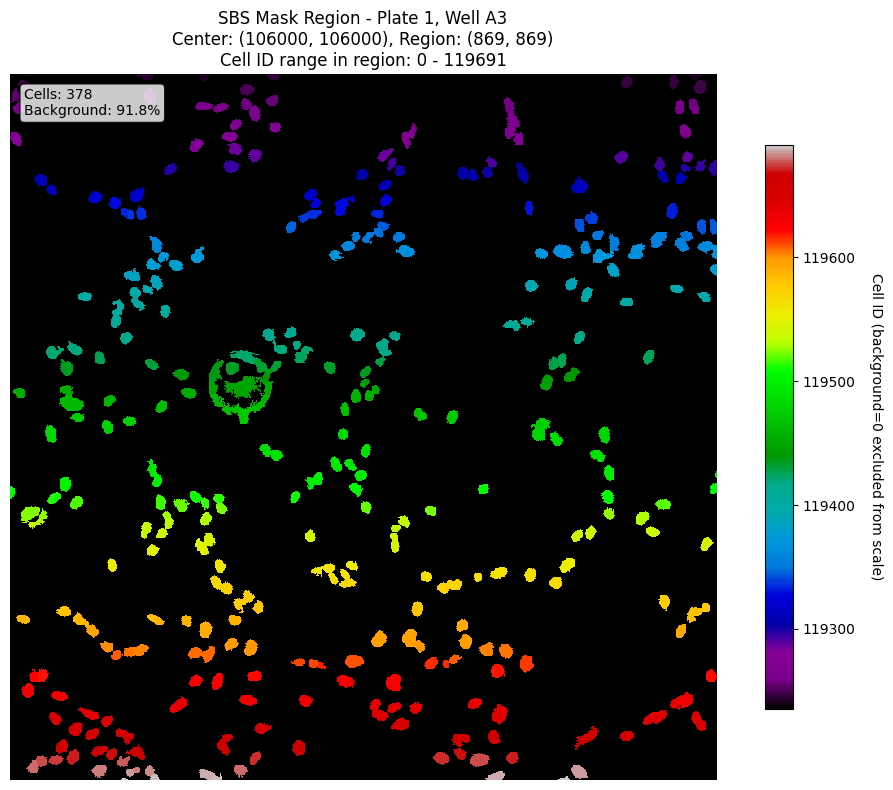


Regional statistics:
  Number of unique cells: 378
  Cell density: 8.2% of region
  Average cell ID: 119474
Viewing 7000x7000 mask region centered at (106000, 106000)
Mask shape: (212372, 212371)
Final extracted region shape: (7000, 7000)
Final bounds used: [102500:109500, 102500:109500]
Unique mask values in region: 301 values
Cell ID range: 0 to 82161
Background pixels: 46,491,088 (94.9%)
Cell pixels: 2,508,912 (5.1%)
Adaptive colormap range: 75451 to 82161 (excluding background)


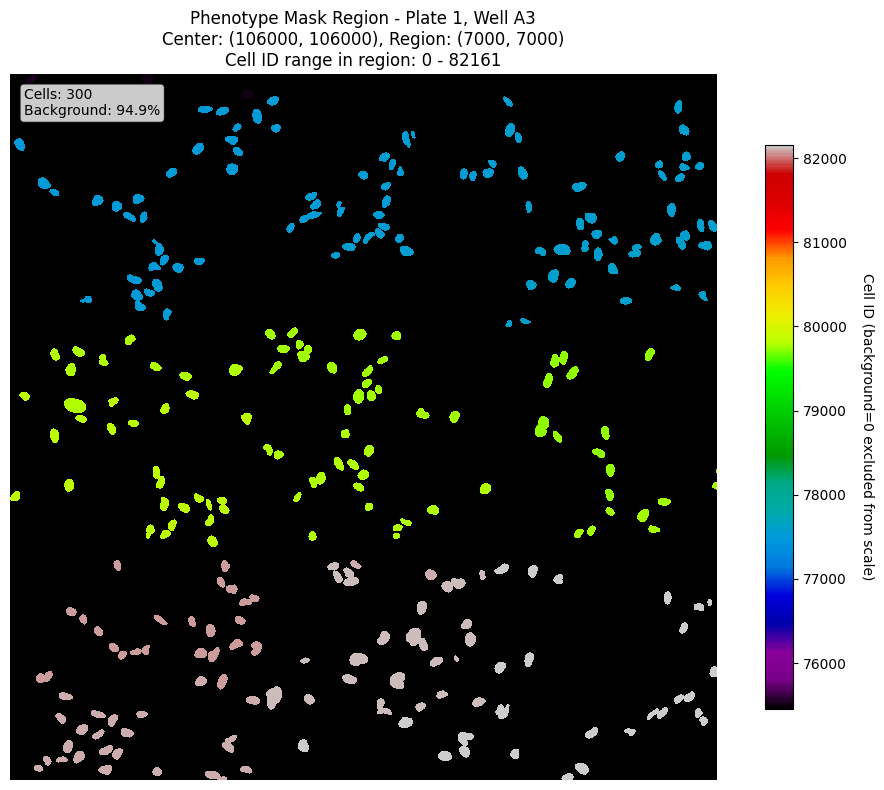


Regional statistics:
  Number of unique cells: 300
  Cell density: 5.1% of region
  Average cell ID: 79700


array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint32)

In [3]:
qc.view_mask_region(center_row=106000, center_col=106000, size=7000 , modality="sbs")
qc.view_mask_region(center_row=106000, center_col=106000, size=7000 , modality="phenotype")

In [ ]:
import numpy as np

# Load and check the actual dimensions
ph_img = np.load(qc.phenotype_image, mmap_mode='r')
print(f"Phenotype image shape: {ph_img.shape}")
print(f"Height (rows): 0 to {ph_img.shape[0]-1}")  
print(f"Width (cols): 0 to {ph_img.shape[1]-1}")

if qc.sbs_image.exists():
    sbs_img = np.load(qc.sbs_image, mmap_mode='r')
    print(f"SBS image shape: {sbs_img.shape}")

Phenotype image shape: (212371, 212372)
Height (rows): 0 to 212370
Width (cols): 0 to 212371
SBS image shape: (26370, 26370)


In [ ]:
# Set your paths
BASE_PATH = "/lab/ops_analysis/lourido/nebo-analysis/analysis/analysis_root/merge"  # Update this!
PLATE = "1"
WELL = "A3"

Initialized QC for Plate 1, Well A3

=== File Status ===
Phenotype Image      ✅ EXISTS (90203.3 MB)
Phenotype Mask       ✅ EXISTS (180406.6 MB)
Phenotype Positions  ✅ EXISTS (7.0 MB)
Phenotype Overlay    ✅ EXISTS (0.0 MB)
SBS Image            ✅ EXISTS (1390.8 MB)
SBS Mask             ✅ EXISTS (2781.5 MB)
SBS Positions        ✅ EXISTS (8.0 MB)
SBS Overlay          ✅ EXISTS (342.0 MB)


DecompressionBombError: Image size (695376900 pixels) exceeds limit of 178956970 pixels, could be decompression bomb DOS attack.

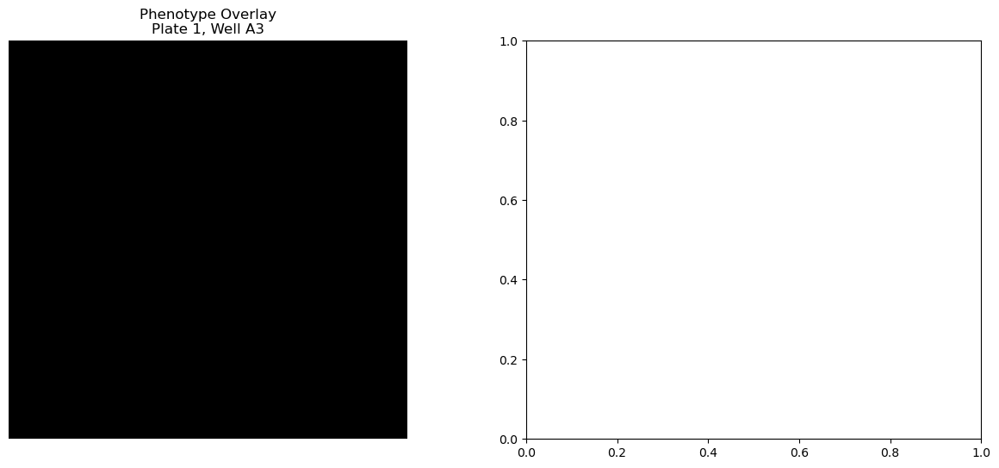

In [ ]:
# This is what you'll use 90% of the time
# Shows overlays + cell counts - if this looks good, you're probably fine!
quick_qc(BASE_PATH, PLATE, WELL)
# When you just want to see the pretty pictures
# qc.view_overlays(BASE_PATH, PLATE, WELL)

# Other stuff

## Load Full Stitched Image

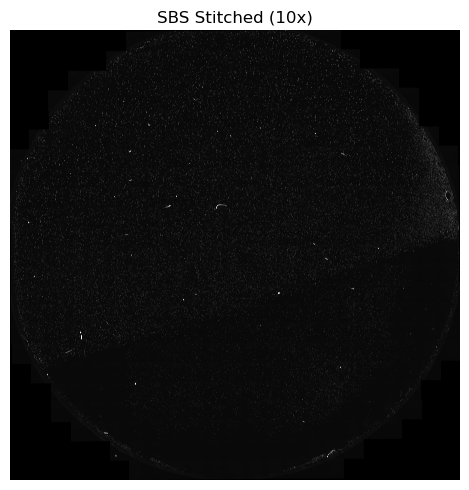

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import io

# Load the stitched images
# phenotype_stitched = np.load('analysis_root/merge/stitched/P-1_W-A3__phenotype_stitched.npy')
sbs_stitched = np.load('/lab/ops_analysis/lourido/nebo-analysis/analysis/analysis_root/merge/stitched_images/P-1_W-A3__sbs_stitched_image.npy')

# Display them
plt.figure(figsize=(15, 5))

# plt.subplot(1, 2, 1)
# plt.imshow(phenotype_stitched, cmap='gray')
# plt.title('Phenotype Stitched (40x)')
# plt.axis('off')

plt.subplot(1, 2, 2) 
plt.imshow(sbs_stitched, cmap='gray')
plt.title('SBS Stitched (10x)')
plt.axis('off')

plt.tight_layout()
plt.show()

# # Or save as viewable images
# io.imsave('phenotype_stitched.png', phenotype_stitched)
# io.imsave('sbs_stitched.png', sbs_stitched)

# Evaluate well_stitch

🔬 STITCHING EVALUATION
📊 Basic Statistics:
  Total cells detected: 176967
  Well: A3
  Data type: sbs

📐 Position Statistics:
  X coordinates (j): 111 to 26330
  Y coordinates (i): 21 to 26113
  X range: 26219 pixels
  Y range: 26092 pixels

📏 Cell Size Statistics:
  Mean area: 166.0 pixels²
  Median area: 163.0 pixels²
  Min area: 1 pixels²
  Max area: 449 pixels²

🎯 Geometry Analysis:
  Center position: (13950, 11035)
  Distance from center: 8373 ± 3349 pixels
  Min distance: 33 pixels
  Max distance: 15982 pixels
  Coefficient of variation: 0.400
  ✅ Good circular geometry preserved


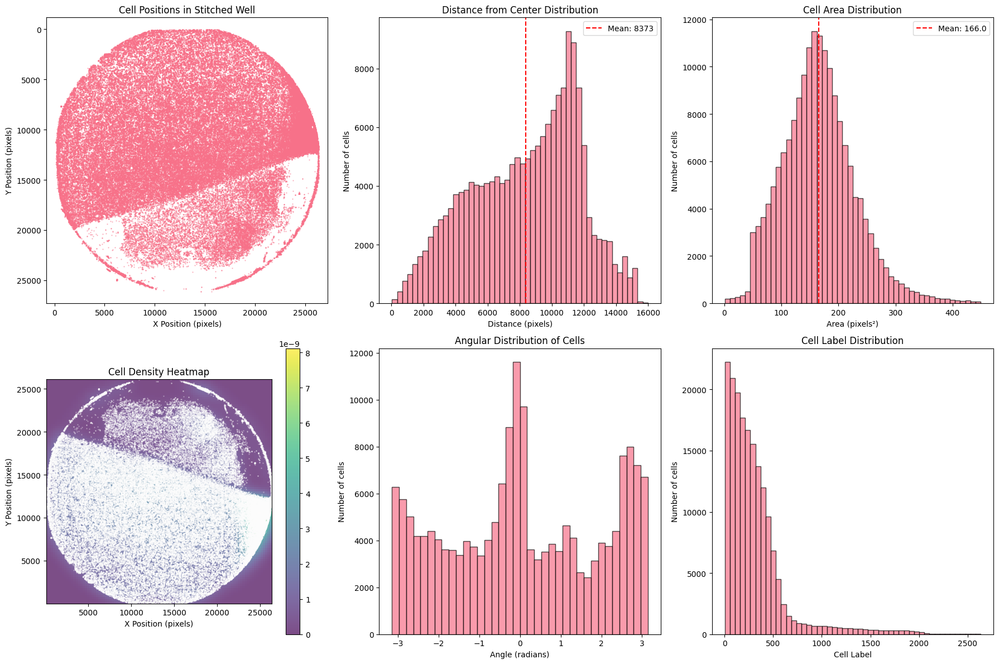


🎯 FINAL ASSESSMENT:
✅ Success indicators:
   • Good cell count (176967)
   • Circular geometry preserved (CV: 0.400)
   • Reasonable cell sizes (mean: 166.0)

🎉 OVERALL: Stitching appears SUCCESSFUL!
   Circular well geometry preserved with good cell detection.


In [6]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Load the cell positions from the stitched phenotype
cell_positions = pd.read_parquet('/lab/ops_analysis/lourido/nebo-analysis/analysis/analysis_root/merge/cell_positions/P-1_W-A3__sbs_cell_positions.parquet')

print("🔬 STITCHING EVALUATION")
print("=" * 50)

# Basic statistics
print(f"📊 Basic Statistics:")
print(f"  Total cells detected: {len(cell_positions)}")
print(f"  Well: {cell_positions['well'].iloc[0] if len(cell_positions) > 0 else 'N/A'}")
print(f"  Data type: {cell_positions['data_type'].iloc[0] if len(cell_positions) > 0 else 'N/A'}")

if len(cell_positions) == 0:
    print("❌ No cells detected - stitching may have failed")
    exit()

# Position statistics
print(f"\n📐 Position Statistics:")
print(f"  X coordinates (j): {cell_positions['j'].min():.0f} to {cell_positions['j'].max():.0f}")
print(f"  Y coordinates (i): {cell_positions['i'].min():.0f} to {cell_positions['i'].max():.0f}")
print(f"  X range: {cell_positions['j'].max() - cell_positions['j'].min():.0f} pixels")
print(f"  Y range: {cell_positions['i'].max() - cell_positions['i'].min():.0f} pixels")

# Area statistics
print(f"\n📏 Cell Size Statistics:")
print(f"  Mean area: {cell_positions['area'].mean():.1f} pixels²")
print(f"  Median area: {cell_positions['area'].median():.1f} pixels²")
print(f"  Min area: {cell_positions['area'].min():.0f} pixels²")
print(f"  Max area: {cell_positions['area'].max():.0f} pixels²")

# Check for circular geometry
print(f"\n🎯 Geometry Analysis:")
center_x = cell_positions['j'].mean()
center_y = cell_positions['i'].mean()

print(f"  Center position: ({center_x:.0f}, {center_y:.0f})")

# Calculate distances from center
distances = np.sqrt((cell_positions['j'] - center_x)**2 + (cell_positions['i'] - center_y)**2)

print(f"  Distance from center: {distances.mean():.0f} ± {distances.std():.0f} pixels")
print(f"  Min distance: {distances.min():.0f} pixels")
print(f"  Max distance: {distances.max():.0f} pixels")

# Coefficient of variation for circularity
cv = distances.std() / distances.mean()
print(f"  Coefficient of variation: {cv:.3f}")

if cv < 0.3:
    print("  ✅ Excellent circular geometry preserved")
elif cv < 0.5:
    print("  ✅ Good circular geometry preserved")  
elif cv < 0.7:
    print("  ⚠️  Acceptable circular geometry")
else:
    print("  ❌ Poor circular geometry - may be distorted")

# Create comprehensive visualization
fig, axes = plt.subplots(2, 3, figsize=(18, 12))

# 1. Cell positions scatter plot
axes[0, 0].scatter(cell_positions['j'], cell_positions['i'], alpha=0.5, s=0.4)
axes[0, 0].set_title('Cell Positions in Stitched Well')
axes[0, 0].set_xlabel('X Position (pixels)')
axes[0, 0].set_ylabel('Y Position (pixels)')
axes[0, 0].axis('equal')
axes[0, 0].invert_yaxis()

# # Add circle overlay for reference
# circle = plt.Circle((center_x, center_y), distances.mean(), fill=False, color='red', linestyle='--', alpha=0.7)
# axes[0, 0].add_patch(circle)

# 2. Distance from center histogram
axes[0, 1].hist(distances, bins=50, alpha=0.7, edgecolor='black')
axes[0, 1].set_title('Distance from Center Distribution')
axes[0, 1].set_xlabel('Distance (pixels)')
axes[0, 1].set_ylabel('Number of cells')
axes[0, 1].axvline(distances.mean(), color='red', linestyle='--', label=f'Mean: {distances.mean():.0f}')
axes[0, 1].legend()

# 3. Cell area histogram
axes[0, 2].hist(cell_positions['area'], bins=50, alpha=0.7, edgecolor='black')
axes[0, 2].set_title('Cell Area Distribution')
axes[0, 2].set_xlabel('Area (pixels²)')
axes[0, 2].set_ylabel('Number of cells')
axes[0, 2].axvline(cell_positions['area'].mean(), color='red', linestyle='--', label=f'Mean: {cell_positions["area"].mean():.1f}')
axes[0, 2].legend()

# 4. Cell density heatmap
from scipy.stats import gaussian_kde
if len(cell_positions) > 100:  # Only if enough cells for density estimation
    try:
        positions = np.vstack([cell_positions['j'], cell_positions['i']])
        kde = gaussian_kde(positions)
        
        # Create grid for heatmap
        x_min, x_max = cell_positions['j'].min(), cell_positions['j'].max()
        y_min, y_max = cell_positions['i'].min(), cell_positions['i'].max()
        
        xx, yy = np.mgrid[x_min:x_max:100j, y_min:y_max:100j]
        positions_grid = np.vstack([xx.ravel(), yy.ravel()])
        density = kde(positions_grid).reshape(xx.shape)
        
        im = axes[1, 0].imshow(density.T, origin='lower', extent=[x_min, x_max, y_min, y_max], cmap='viridis', alpha=0.7)
        axes[1, 0].scatter(cell_positions['j'], cell_positions['i'], alpha=0.3, s=0.5, color='white')
        axes[1, 0].set_title('Cell Density Heatmap')
        axes[1, 0].set_xlabel('X Position (pixels)')
        axes[1, 0].set_ylabel('Y Position (pixels)')
        plt.colorbar(im, ax=axes[1, 0])
    except:
        axes[1, 0].text(0.5, 0.5, 'Density plot failed', ha='center', va='center', transform=axes[1, 0].transAxes)
        axes[1, 0].set_title('Cell Density (Failed)')

# 5. Radial distribution
angles = np.arctan2(cell_positions['i'] - center_y, cell_positions['j'] - center_x)
axes[1, 1].hist(angles, bins=36, alpha=0.7, edgecolor='black')  # 36 bins = 10° each
axes[1, 1].set_title('Angular Distribution of Cells')
axes[1, 1].set_xlabel('Angle (radians)')
axes[1, 1].set_ylabel('Number of cells')

# 6. Cell ID distribution (check for reasonable labeling)
axes[1, 2].hist(cell_positions['cell'], bins=50, alpha=0.7, edgecolor='black')
axes[1, 2].set_title('Cell Label Distribution')
axes[1, 2].set_xlabel('Cell Label')
axes[1, 2].set_ylabel('Number of cells')

plt.tight_layout()
plt.show()

# Summary assessment
print(f"\n🎯 FINAL ASSESSMENT:")
print(f"=" * 30)

success_indicators = []
warnings = []

if len(cell_positions) > 1000:
    success_indicators.append(f"Good cell count ({len(cell_positions)})")
else:
    warnings.append(f"Low cell count ({len(cell_positions)})")

if cv < 0.5:
    success_indicators.append(f"Circular geometry preserved (CV: {cv:.3f})")
else:
    warnings.append(f"Geometry may be distorted (CV: {cv:.3f})")

if cell_positions['area'].mean() > 10:
    success_indicators.append(f"Reasonable cell sizes (mean: {cell_positions['area'].mean():.1f})")
else:
    warnings.append(f"Very small cell sizes (mean: {cell_positions['area'].mean():.1f})")

print(f"✅ Success indicators:")
for indicator in success_indicators:
    print(f"   • {indicator}")

if warnings:
    print(f"\n⚠️  Potential issues:")
    for warning in warnings:
        print(f"   • {warning}")

if len(success_indicators) >= 2 and len(warnings) <= 1:
    print(f"\n🎉 OVERALL: Stitching appears SUCCESSFUL!")
    print(f"   Circular well geometry preserved with good cell detection.")
else:
    print(f"\n🤔 OVERALL: Mixed results - may need investigation")
    print(f"   Check the visualizations above for detailed analysis.")

In [ ]:
import pandas as pd
import numpy as np

# Quick diagnostic of cell count loss
cell_positions = pd.read_parquet('/lab/ops_analysis/lourido/nebo-analysis/analysis/analysis_root/merge/cell_positions/P-1_W-A3__sbs_cell_positions.parquet')

print("🔍 CELL COUNT DIAGNOSTIC")
print("=" * 40)

print(f"Expected cells: 169088")
print(f"Actual cells: {len(cell_positions):,}")
print(f"Recovery rate: {len(cell_positions)/169088*100:.1f}%")
print(f"Missing cells: {169088 - len(cell_positions):,}")

# Check cell label distribution
print(f"\n📊 Cell Label Analysis:")
print(f"Min cell label: {cell_positions['cell'].min()}")
print(f"Max cell label: {cell_positions['cell'].max()}")
print(f"Unique labels: {cell_positions['cell'].nunique()}")

# # Check for label gaps (sign of relabeling issues)
# labels = cell_positions['cell'].values
# consecutive_labels = np.arange(labels.min(), labels.max() + 1)
# missing_labels = set(consecutive_labels) - set(labels)

# print(f"Missing labels in sequence: {len(missing_labels)}")
# if len(missing_labels) > 0:
#     print(f"  Example missing: {sorted(missing_labels)[:10]}")

# # Check cell size distribution for anomalies
# print(f"\n📏 Cell Size Analysis:")
# tiny_cells = (cell_positions['area'] < 10).sum()
# huge_cells = (cell_positions['area'] > 10000).sum()
# normal_cells = len(cell_positions) - tiny_cells - huge_cells

# print(f"Tiny cells (< 10 px²): {tiny_cells}")
# print(f"Normal cells: {normal_cells}")  
# print(f"Huge cells (> 10k px²): {huge_cells}")

# if huge_cells > 0:
#     print(f"  Largest cell: {cell_positions['area'].max():,} px²")
#     print("  ⚠️  Large cells suggest over-merging during stitching")

# if tiny_cells > 1000:
#     print("  ⚠️  Many tiny cells suggest fragmentation")

# # Estimate what the cell density should be
# total_pixels = 16975 * 18825  # From your range data
# pixels_per_expected_cell = total_pixels / 296532
# pixels_per_actual_cell = total_pixels / len(cell_positions)

# print(f"\n🎯 Density Analysis:")
# print(f"Expected density: {pixels_per_expected_cell:.0f} pixels/cell")
# print(f"Actual density: {pixels_per_actual_cell:.0f} pixels/cell")
# print(f"Density ratio: {pixels_per_actual_cell/pixels_per_expected_cell:.1f}x sparser")

# # Quick recommendation
# print(f"\n💡 LIKELY CAUSE:")
# if huge_cells > len(cell_positions) * 0.1:  # >10% huge cells
#     print("❌ Over-merging during mask stitching")
#     print("   → Cells were incorrectly merged due to overlap handling")
#     print("   → Need to adjust overlap resolution in assemble_stitched_masks_optimized")
# elif tiny_cells > len(cell_positions) * 0.1:
#     print("❌ Fragmentation during mask stitching") 
#     print("   → Cells were broken apart during relabeling")
# else:
#     print("❌ Cell loss during tile processing")
#     print("   → Some tiles may not have contributed their masks")
#     print("   → Check if all 6809 tiles were processed in mask assembly")

# print(f"\n🔧 NEXT ACTION:")
# print("1. Check the stitched mask file directly")
# print("2. Verify mask assembly processed all tiles")
# print("3. Consider adjusting overlap handling parameters")

🔍 CELL COUNT DIAGNOSTIC
Expected cells: 169088
Actual cells: 0
Recovery rate: 0.0%
Missing cells: 169,088

📊 Cell Label Analysis:
Min cell label: nan
Max cell label: nan
Unique labels: 0


=== LOADING ENHANCED CELL POSITIONS ===
✅ Loaded phenotype positions: 138006 cells
Phenotype columns: ['well', 'stitched_cell_id', 'i', 'j', 'area', 'data_type', 'cell', 'original_cell_id', 'original_tile_id', 'tile', 'tile_i', 'tile_j', 'mapping_method', 'stage_x', 'stage_y', 'tile_row', 'tile_col']
✅ Loaded SBS positions: 176967 cells
SBS columns: ['well', 'stitched_cell_id', 'i', 'j', 'area', 'data_type', 'cell', 'original_cell_id', 'original_tile_id', 'tile', 'tile_i', 'tile_j', 'mapping_method', 'stage_x', 'stage_y', 'tile_row', 'tile_col']

=== PHENOTYPE TILE ANALYSIS ===
Total cells: 138,006
Unique tiles: 6329
Cells per tile: min=1, max=239, mean=21.8
Global coordinates:
  i (Y): 61.5 to 211717.1
  j (X): 829.4 to 212022.3
Stage coordinates (138006 cells with valid coords):
  stage_x: -56234.7 to -22120.0
  stage_y: -37209.0 to -3097.3

=== SBS TILE ANALYSIS ===
Total cells: 176,967
Unique tiles: 447
Cells per tile: min=1, max=2635, mean=395.9
Global coordinates:
  i (Y): 20.9 t

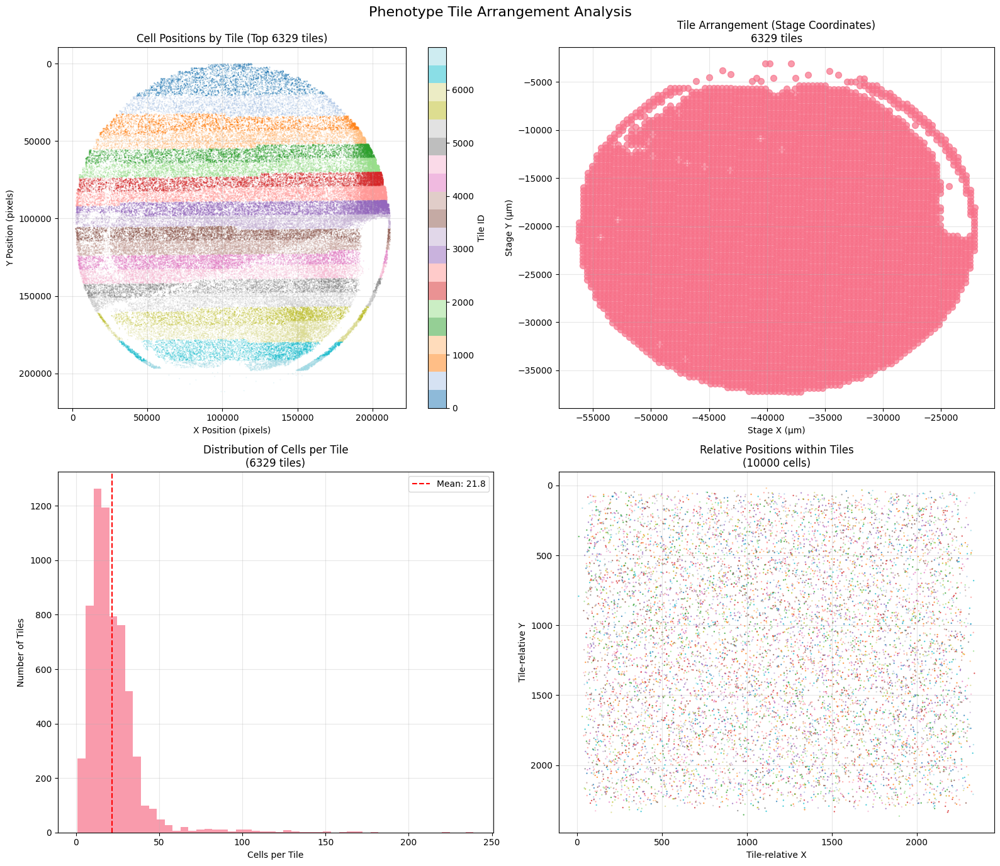


=== SBS TILE VISUALIZATION ===


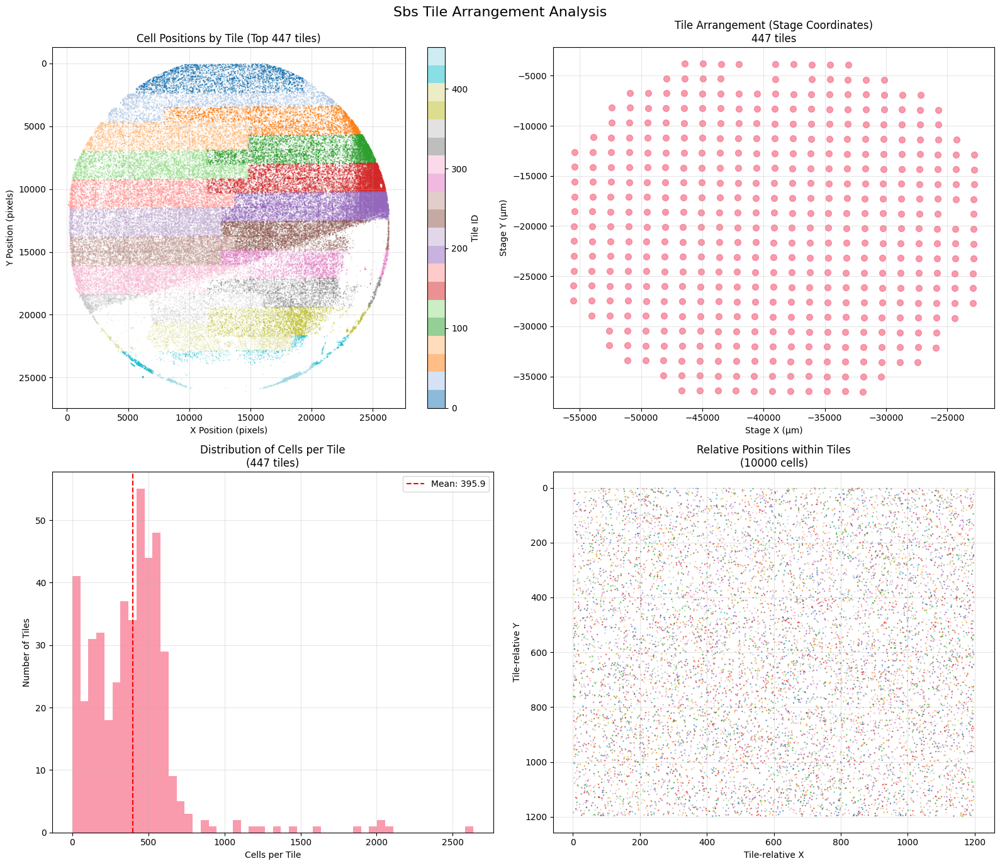


=== COMPARISON VISUALIZATION ===


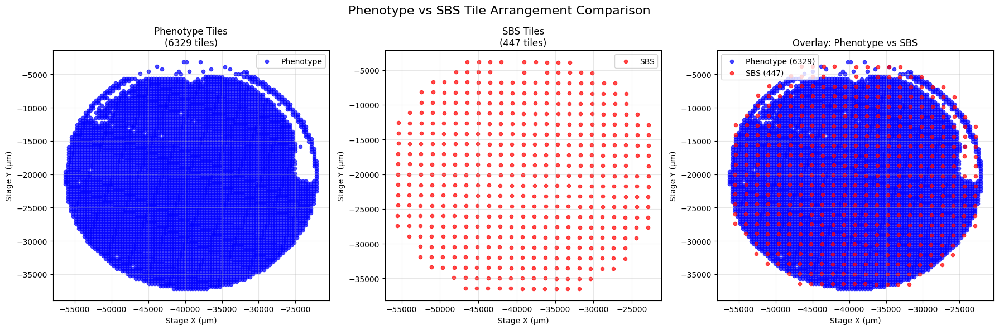


=== DIAGNOSTIC SUMMARY ===
Look for these issues in the plots:
1. 🔍 TILE ARRANGEMENT:
   - Are tiles arranged in expected circular pattern?
   - Are stage coordinates reasonable?
   - Do phenotype and SBS cover similar regions?

2. 🔍 COORDINATE SYSTEM:
   - Is top-left in the expected position?
   - Are X/Y axes oriented correctly?
   - Do pixel positions match stage positions?

3. 🔍 TILE ASSIGNMENT:
   - Are cells properly assigned to tiles?
   - Are there many unassigned cells (tile=-1)?
   - Do tile-relative positions look reasonable?

=== TILE OVERLAP CHECK ===
Common tile IDs: 446
Phenotype-only tiles: 5883
SBS-only tiles: 1
Sample common tiles: [np.int64(0), np.int64(1), np.int64(2), np.int64(3), np.int64(4), np.int64(5), np.int64(6), np.int64(7), np.int64(8), np.int64(9)]
Unassigned cells - Phenotype: 0, SBS: 0


In [11]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path

# ================================
# LOAD YOUR ENHANCED CELL POSITIONS
# ================================

# Update these paths to your actual parquet files
phenotype_positions_path = "/lab/ops_analysis/lourido/nebo-analysis/analysis/analysis_root/merge/cell_positions/P-1_W-A3__phenotype_cell_positions.parquet"
sbs_positions_path = "/lab/ops_analysis/lourido/nebo-analysis/analysis/analysis_root/merge/cell_positions/P-1_W-A3__sbs_cell_positions.parquet"

print("=== LOADING ENHANCED CELL POSITIONS ===")

# Load phenotype positions
if Path(phenotype_positions_path).exists():
    pheno_df = pd.read_parquet(phenotype_positions_path)
    print(f"✅ Loaded phenotype positions: {len(pheno_df)} cells")
    print(f"Phenotype columns: {list(pheno_df.columns)}")
else:
    print(f"❌ Phenotype file not found: {phenotype_positions_path}")
    pheno_df = None

# Load SBS positions  
if Path(sbs_positions_path).exists():
    sbs_df = pd.read_parquet(sbs_positions_path)
    print(f"✅ Loaded SBS positions: {len(sbs_df)} cells")
    print(f"SBS columns: {list(sbs_df.columns)}")
else:
    print(f"❌ SBS file not found: {sbs_positions_path}")
    sbs_df = None

# ================================
# ANALYZE TILE INFORMATION
# ================================

def analyze_tile_info(df, data_type):
    """Analyze tile information in the dataframe"""
    print(f"\n=== {data_type.upper()} TILE ANALYSIS ===")
    
    if df is None or len(df) == 0:
        print("No data to analyze")
        return
    
    # Basic stats
    print(f"Total cells: {len(df):,}")
    
    if 'tile' in df.columns:
        unique_tiles = df['tile'].nunique()
        print(f"Unique tiles: {unique_tiles}")
        
        # Cells per tile stats
        cells_per_tile = df['tile'].value_counts()
        print(f"Cells per tile: min={cells_per_tile.min()}, max={cells_per_tile.max()}, mean={cells_per_tile.mean():.1f}")
        
        # Tiles with no cells assigned
        unassigned = (df['tile'] == -1).sum()
        if unassigned > 0:
            print(f"Unassigned cells (tile=-1): {unassigned} ({unassigned/len(df)*100:.1f}%)")
    
    # Coordinate ranges
    if 'i' in df.columns and 'j' in df.columns:
        print(f"Global coordinates:")
        print(f"  i (Y): {df['i'].min():.1f} to {df['i'].max():.1f}")
        print(f"  j (X): {df['j'].min():.1f} to {df['j'].max():.1f}")
    
    # Stage coordinates if available
    if 'stage_x' in df.columns and 'stage_y' in df.columns:
        # Remove NaN values for analysis
        valid_stage = df.dropna(subset=['stage_x', 'stage_y'])
        if len(valid_stage) > 0:
            print(f"Stage coordinates ({len(valid_stage)} cells with valid coords):")
            print(f"  stage_x: {valid_stage['stage_x'].min():.1f} to {valid_stage['stage_x'].max():.1f}")
            print(f"  stage_y: {valid_stage['stage_y'].min():.1f} to {valid_stage['stage_y'].max():.1f}")

# Analyze both datasets
if pheno_df is not None:
    analyze_tile_info(pheno_df, "phenotype")

if sbs_df is not None:
    analyze_tile_info(sbs_df, "sbs")

# ================================
# VISUALIZATION FUNCTIONS
# ================================

def plot_cell_positions_by_tile(df, data_type, max_tiles_to_color=7000):
    """Plot cell positions colored by tile"""
    
    if df is None or len(df) == 0:
        print(f"No {data_type} data to plot")
        return
    
    fig, axes = plt.subplots(2, 2, figsize=(16, 14))
    fig.suptitle(f'{data_type.title()} Tile Arrangement Analysis', fontsize=16)
    
    # Plot 1: All cells colored by tile (sample if too many tiles)
    ax1 = axes[0, 0]
    if 'tile' in df.columns and 'i' in df.columns and 'j' in df.columns:
        # Sample tiles if too many
        tile_counts = df['tile'].value_counts()
        top_tiles = tile_counts.head(max_tiles_to_color).index
        
        df_plot = df[df['tile'].isin(top_tiles)]
        
        if len(df_plot) > 0:
            scatter = ax1.scatter(df_plot['j'], df_plot['i'], 
                                c=df_plot['tile'], cmap='tab20', 
                                s=0.05, alpha=0.5)
            plt.colorbar(scatter, ax=ax1, label='Tile ID')
            ax1.set_title(f'Cell Positions by Tile (Top {len(top_tiles)} tiles)')
        else:
            ax1.set_title('No valid tile data')
    
    ax1.set_xlabel('X Position (pixels)')
    ax1.set_ylabel('Y Position (pixels)')
    ax1.invert_yaxis()
    ax1.grid(True, alpha=0.3)
    
    # Plot 2: Stage coordinates with tile numbers
    ax2 = axes[0, 1]
    if 'stage_x' in df.columns and 'stage_y' in df.columns and 'tile' in df.columns:
        # Get unique tiles and their stage positions
        tile_info = df.groupby('tile').agg({
            'stage_x': 'first',
            'stage_y': 'first'
        }).reset_index()
        
        # Remove NaN stage coordinates
        tile_info_valid = tile_info.dropna(subset=['stage_x', 'stage_y'])
        
        if len(tile_info_valid) > 0:
            ax2.scatter(tile_info_valid['stage_x'], tile_info_valid['stage_y'], 
                       s=50, alpha=0.7)
            
            # Annotate with tile IDs (sample if too many)
            if len(tile_info_valid) <= 50:
                for _, row in tile_info_valid.iterrows():
                    ax2.annotate(f"{int(row['tile'])}", 
                               (row['stage_x'], row['stage_y']), 
                               fontsize=6, ha='center', alpha=0.8)
            
            ax2.set_title(f'Tile Arrangement (Stage Coordinates)\n{len(tile_info_valid)} tiles')
        else:
            ax2.set_title('No valid stage coordinate data')
    
    ax2.set_xlabel('Stage X (μm)')
    ax2.set_ylabel('Stage Y (μm)')
    ax2.grid(True, alpha=0.3)
    
    # Plot 3: Cells per tile histogram
    ax3 = axes[1, 0]
    if 'tile' in df.columns:
        tile_counts = df['tile'].value_counts()
        valid_tiles = tile_counts[tile_counts.index != -1]  # Exclude unassigned
        
        if len(valid_tiles) > 0:
            ax3.hist(valid_tiles.values, bins=min(50, len(valid_tiles)), alpha=0.7)
            ax3.axvline(valid_tiles.mean(), color='red', linestyle='--', 
                       label=f'Mean: {valid_tiles.mean():.1f}')
            ax3.legend()
            ax3.set_title(f'Distribution of Cells per Tile\n({len(valid_tiles)} tiles)')
        else:
            ax3.set_title('No valid tile data')
    
    ax3.set_xlabel('Cells per Tile')
    ax3.set_ylabel('Number of Tiles')
    ax3.grid(True, alpha=0.3)
    
    # Plot 4: Tile-relative positions (if available)
    ax4 = axes[1, 1]
    if 'tile_i' in df.columns and 'tile_j' in df.columns and 'tile' in df.columns:
        # Sample cells if too many
        df_sample = df.sample(n=min(10000, len(df))) if len(df) > 10000 else df
        valid_relative = df_sample.dropna(subset=['tile_i', 'tile_j'])
        
        if len(valid_relative) > 0:
            scatter = ax4.scatter(valid_relative['tile_j'], valid_relative['tile_i'], 
                                c=valid_relative['tile'], cmap='tab20', 
                                s=0.5, alpha=0.7)
            ax4.set_title(f'Relative Positions within Tiles\n({len(valid_relative)} cells)')
        else:
            ax4.set_title('No valid tile-relative position data')
    
    ax4.set_xlabel('Tile-relative X')
    ax4.set_ylabel('Tile-relative Y')
    ax4.invert_yaxis()
    ax4.grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.show()

def compare_tile_arrangements(pheno_df, sbs_df):
    """Compare tile arrangements between phenotype and SBS"""
    
    if pheno_df is None or sbs_df is None:
        print("Cannot compare - missing data")
        return
    
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))
    fig.suptitle('Phenotype vs SBS Tile Arrangement Comparison', fontsize=16)
    
    # Phenotype stage coordinates
    ax1 = axes[0]
    if 'stage_x' in pheno_df.columns and 'stage_y' in pheno_df.columns:
        pheno_tiles = pheno_df.groupby('tile').agg({
            'stage_x': 'first', 'stage_y': 'first'
        }).reset_index().dropna()
        
        if len(pheno_tiles) > 0:
            ax1.scatter(pheno_tiles['stage_x'], pheno_tiles['stage_y'], 
                       s=20, alpha=0.7, color='blue', label='Phenotype')
            ax1.set_title(f'Phenotype Tiles\n({len(pheno_tiles)} tiles)')
    
    ax1.set_xlabel('Stage X (μm)')
    ax1.set_ylabel('Stage Y (μm)')
    ax1.grid(True, alpha=0.3)
    ax1.legend()
    
    # SBS stage coordinates
    ax2 = axes[1]
    if 'stage_x' in sbs_df.columns and 'stage_y' in sbs_df.columns:
        sbs_tiles = sbs_df.groupby('tile').agg({
            'stage_x': 'first', 'stage_y': 'first'
        }).reset_index().dropna()
        
        if len(sbs_tiles) > 0:
            ax2.scatter(sbs_tiles['stage_x'], sbs_tiles['stage_y'], 
                       s=20, alpha=0.7, color='red', label='SBS')
            ax2.set_title(f'SBS Tiles\n({len(sbs_tiles)} tiles)')
    
    ax2.set_xlabel('Stage X (μm)')
    ax2.set_ylabel('Stage Y (μm)')
    ax2.grid(True, alpha=0.3)
    ax2.legend()
    
    # Overlay both
    ax3 = axes[2]
    if 'pheno_tiles' in locals() and len(pheno_tiles) > 0:
        ax3.scatter(pheno_tiles['stage_x'], pheno_tiles['stage_y'], 
                   s=20, alpha=0.7, color='blue', label=f'Phenotype ({len(pheno_tiles)})')
    
    if 'sbs_tiles' in locals() and len(sbs_tiles) > 0:
        ax3.scatter(sbs_tiles['stage_x'], sbs_tiles['stage_y'], 
                   s=20, alpha=0.7, color='red', label=f'SBS ({len(sbs_tiles)})')
    
    ax3.set_title('Overlay: Phenotype vs SBS')
    ax3.set_xlabel('Stage X (μm)')
    ax3.set_ylabel('Stage Y (μm)')
    ax3.grid(True, alpha=0.3)
    ax3.legend()
    
    plt.tight_layout()
    plt.show()

# ================================
# CREATE ALL VISUALIZATIONS
# ================================

# Plot individual tile arrangements
if pheno_df is not None:
    print("\n=== PHENOTYPE TILE VISUALIZATION ===")
    plot_cell_positions_by_tile(pheno_df, "phenotype")

if sbs_df is not None:
    print("\n=== SBS TILE VISUALIZATION ===")
    plot_cell_positions_by_tile(sbs_df, "sbs")

# Compare arrangements
if pheno_df is not None and sbs_df is not None:
    print("\n=== COMPARISON VISUALIZATION ===")
    compare_tile_arrangements(pheno_df, sbs_df)

# ================================
# DIAGNOSTIC SUMMARY
# ================================

print("\n=== DIAGNOSTIC SUMMARY ===")
print("Look for these issues in the plots:")
print("1. 🔍 TILE ARRANGEMENT:")
print("   - Are tiles arranged in expected circular pattern?")
print("   - Are stage coordinates reasonable?")
print("   - Do phenotype and SBS cover similar regions?")
print("")
print("2. 🔍 COORDINATE SYSTEM:")
print("   - Is top-left in the expected position?")
print("   - Are X/Y axes oriented correctly?")
print("   - Do pixel positions match stage positions?")
print("")
print("3. 🔍 TILE ASSIGNMENT:")
print("   - Are cells properly assigned to tiles?")
print("   - Are there many unassigned cells (tile=-1)?")
print("   - Do tile-relative positions look reasonable?")

# Quick tile overlap check
if pheno_df is not None and sbs_df is not None:
    print("\n=== TILE OVERLAP CHECK ===")
    if 'tile' in pheno_df.columns and 'tile' in sbs_df.columns:
        pheno_tiles = set(pheno_df['tile'].unique())
        sbs_tiles = set(sbs_df['tile'].unique())
        
        common_tiles = pheno_tiles & sbs_tiles
        print(f"Common tile IDs: {len(common_tiles)}")
        print(f"Phenotype-only tiles: {len(pheno_tiles - sbs_tiles)}")
        print(f"SBS-only tiles: {len(sbs_tiles - pheno_tiles)}")
        
        if len(common_tiles) > 0:
            print(f"Sample common tiles: {sorted(list(common_tiles))[:10]}")
        
        # Check if tile=-1 (unassigned) is common
        pheno_unassigned = (pheno_df['tile'] == -1).sum()
        sbs_unassigned = (sbs_df['tile'] == -1).sum()
        print(f"Unassigned cells - Phenotype: {pheno_unassigned}, SBS: {sbs_unassigned}")

In [ ]:
import pandas as pd
# Update these paths to your actual parquet files
A3_phenotype_positions = pd.read_parquet('/lab/ops_analysis/lourido/nebo-analysis/analysis/analysis_root/merge/cell_positions/P-1_W-A3__phenotype_cell_positions.parquet')
B2_phenotype_positions= pd.read_parquet('/lab/ops_analysis/lourido/nebo-analysis/analysis/analysis_root/merge/cell_positions/P-1_W-B2__phenotype_cell_positions.parquet')
B2_well_merge = pd.read_parquet('/lab/ops_analysis/lourido/nebo-analysis/analysis/analysis_root/merge/parquets/P-1_W-B2__merge.parquet')

In [ ]:
display(B2_well_merge)

,plate,well,cell_0,i_0,j_0,area_0,cell_1,i_1,j_1,area_1,distance


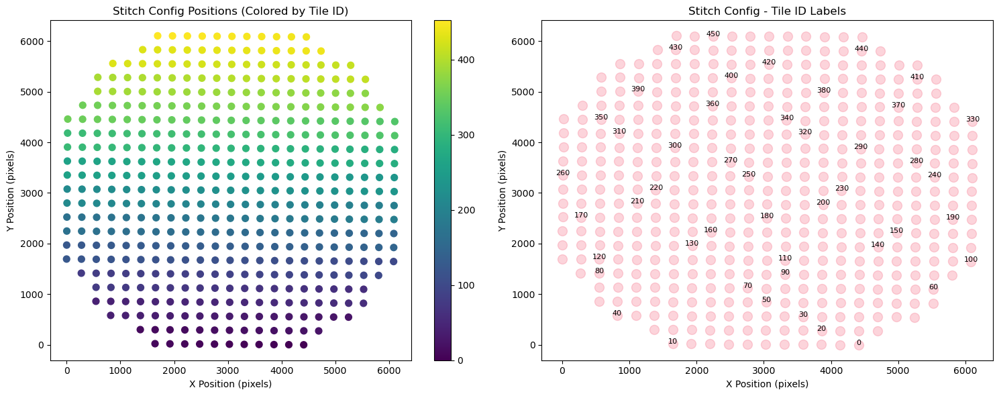

Stitch config has 453 tile positions
First 10 tiles (ID, X, Y):
  Tile 0: (4410, 0)
  Tile 1: (4133, 2)
  Tile 2: (3857, 4)
  Tile 3: (3580, 6)
  Tile 4: (3304, 8)
  Tile 5: (3028, 11)
  Tile 6: (2751, 13)
  Tile 7: (2475, 15)
  Tile 8: (2198, 17)
  Tile 9: (1922, 19)


In [ ]:
# Add this to your notebook:
import matplotlib.pyplot as plt

# Load your SBS stitch config
with open("/lab/ops_analysis/lourido/nebo-analysis/analysis/analysis_root/merge/stitch_configs/P-1_W-A3__sbs_stitch_config.yml", 'r') as f:
    sbs_config = yaml.safe_load(f)

shifts = sbs_config['total_translation']

# Extract tile positions
tile_positions = []
for key, pos in shifts.items():
    tile_id = int(key.split('/')[-1])
    tile_positions.append((tile_id, pos[1], pos[0]))  # (tile_id, x, y)

# Sort by tile ID and plot
tile_positions.sort()

# Plot the stitch config positions
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))

# Plot 1: Positions colored by tile ID
x_pos = [p[1] for p in tile_positions]
y_pos = [p[2] for p in tile_positions]
tile_ids = [p[0] for p in tile_positions]

scatter = ax1.scatter(x_pos, y_pos, c=tile_ids, cmap='viridis', s=50)
ax1.set_title('Stitch Config Positions (Colored by Tile ID)')
ax1.set_xlabel('X Position (pixels)')
ax1.set_ylabel('Y Position (pixels)')
plt.colorbar(scatter, ax=ax1)

# Plot 2: Show tile IDs as text
ax2.scatter(x_pos, y_pos, s=100, alpha=0.3)
for i, (tid, x, y) in enumerate(tile_positions[::10]):  # Show every 10th tile
    ax2.annotate(str(tid), (x, y), fontsize=8, ha='center')
ax2.set_title('Stitch Config - Tile ID Labels')
ax2.set_xlabel('X Position (pixels)')
ax2.set_ylabel('Y Position (pixels)')

plt.tight_layout()
plt.show()

print(f"Stitch config has {len(tile_positions)} tile positions")
print("First 10 tiles (ID, X, Y):")
for i in range(min(10, len(tile_positions))):
    print(f"  Tile {tile_positions[i][0]}: ({tile_positions[i][1]}, {tile_positions[i][2]})")

In [12]:
# STEP 1: Load data (if needed)
import pandas as pd
df_original = pd.read_parquet('/lab/ops_analysis/lourido/nebo-analysis/analysis/analysis_root/phenotype/parquets/P-1_W-A3__phenotype_info.parquet')
df_stitched = pd.read_parquet('/lab/ops_analysis/lourido/nebo-analysis/analysis/analysis_root/merge/cell_positions/P-1_W-A3__phenotype_cell_positions.parquet')

# STEP 2: Standardize column types just in case
df_stitched['original_tile_id'] = df_stitched['original_tile_id'].astype(str)
df_stitched['original_cell_id'] = df_stitched['original_cell_id'].astype(str)
df_original['tile'] = df_original['tile'].astype(str)
df_original['cell'] = df_original['cell'].astype(str)

# STEP 3: Merge stitched → original using (tile, cell)
merged = df_stitched.merge(
    df_original,
    left_on=['original_tile_id', 'original_cell_id'],
    right_on=['tile', 'cell'],
    suffixes=('_stitched', '_original'),
    how='left'  # keep all stitched cells
)

# STEP 4: Find stitched cells not found in original
missing_in_original = merged[merged['cell_original'].isna()]

# STEP 5: Find original cells not present in stitched
merged_back = df_original.merge(
    df_stitched,
    left_on=['tile', 'cell'],
    right_on=['original_tile_id', 'original_cell_id'],
    how='left'
)
missing_in_stitched = merged_back[merged_back['stitched_cell_id'].isna()]

# STEP 6: QC summary
print(f"✅ Total stitched cells: {len(df_stitched):,}")
print(f"✅ Total original cells: {len(df_original):,}")
print(f"✅ Successfully matched: {len(merged) - len(missing_in_original):,}")
print(f"❌ Stitched cells not found in original: {len(missing_in_original):,}")
print(f"❌ Original cells missing in stitched result: {len(missing_in_stitched):,}")

# Optional: Save to CSV for QC
# missing_in_original.to_csv("stitched_but_not_in_original.csv", index=False)
# missing_in_stitched.to_csv("original_but_missing_in_stitched.csv", index=False)


✅ Total stitched cells: 138,006
✅ Total original cells: 138,007
✅ Successfully matched: 138,006
❌ Stitched cells not found in original: 0
❌ Original cells missing in stitched result: 1


## Merge_Eval

In [13]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import seaborn as sns

def visualize_transformation_overlap(
    phenotype_positions, 
    sbs_positions, 
    alignment_result, 
    merged_cells=None,
    sample_size=10000,
    figsize=(15, 12)
):
    """
    Visualize the coordinate transformation and cell overlap for debugging merge yields.
    
    Args:
        phenotype_positions: DataFrame with phenotype cell positions (i, j columns)
        sbs_positions: DataFrame with SBS cell positions (i, j columns)  
        alignment_result: Dict or Series with 'rotation' and 'translation' from alignment
        merged_cells: Optional DataFrame of successfully merged cells
        sample_size: Number of cells to plot (for performance)
        figsize: Figure size tuple
    """
    
    # Extract transformation parameters
    if isinstance(alignment_result, pd.Series):
        rotation = alignment_result['rotation']
        translation = alignment_result['translation']
    else:
        rotation = alignment_result.get('rotation', np.eye(2))
        translation = alignment_result.get('translation', np.zeros(2))
    
    # Ensure proper format
    rotation = np.array(rotation).reshape(2, 2)
    translation = np.array(translation).flatten()[:2]
    
    # Sample cells for visualization performance
    if len(phenotype_positions) > sample_size:
        pheno_sample = phenotype_positions.sample(n=sample_size, random_state=42)
    else:
        pheno_sample = phenotype_positions.copy()
        
    if len(sbs_positions) > sample_size:
        sbs_sample = sbs_positions.sample(n=sample_size, random_state=42)
    else:
        sbs_sample = sbs_positions.copy()
    
    # Get coordinates
    pheno_coords = pheno_sample[['i', 'j']].values
    sbs_coords = sbs_sample[['i', 'j']].values
    
    # Apply transformation
    transformed_coords = pheno_coords @ rotation.T + translation
    
    # Create subplot layout
    fig, axes = plt.subplots(2, 3, figsize=figsize)
    fig.suptitle('Cell Merge Transformation Visualization', fontsize=16, fontweight='bold')
    
    # 1. Original coordinate systems
    ax1 = axes[0, 0]
    ax1.scatter(pheno_coords[:, 1], pheno_coords[:, 0], c='red', alpha=0.5, s=1, label='Phenotype')
    ax1.scatter(sbs_coords[:, 1], sbs_coords[:, 0], c='blue', alpha=0.5, s=1, label='SBS')
    ax1.set_title('Original Coordinates\n(Before Transformation)')
    ax1.set_xlabel('j (columns)')
    ax1.set_ylabel('i (rows)')
    ax1.legend()
    ax1.grid(True, alpha=0.3)
    
    # 2. Transformed phenotype vs SBS
    ax2 = axes[0, 1]
    ax2.scatter(transformed_coords[:, 1], transformed_coords[:, 0], c='red', alpha=0.5, s=1, label='Transformed Phenotype')
    ax2.scatter(sbs_coords[:, 1], sbs_coords[:, 0], c='blue', alpha=0.5, s=1, label='SBS')
    ax2.set_title('After Transformation\n(Phenotype → SBS coordinates)')
    ax2.set_xlabel('j (columns)')
    ax2.set_ylabel('i (rows)')
    ax2.legend()
    ax2.grid(True, alpha=0.3)
    
    # 3. Overlap region focus
    ax3 = axes[0, 2]
    
    # Calculate overlap bounds
    overlap_i_min = max(transformed_coords[:, 0].min(), sbs_coords[:, 0].min())
    overlap_i_max = min(transformed_coords[:, 0].max(), sbs_coords[:, 0].max())
    overlap_j_min = max(transformed_coords[:, 1].min(), sbs_coords[:, 1].min())
    overlap_j_max = min(transformed_coords[:, 1].max(), sbs_coords[:, 1].max())
    
    # Filter to overlap region
    pheno_in_overlap = (
        (transformed_coords[:, 0] >= overlap_i_min) & 
        (transformed_coords[:, 0] <= overlap_i_max) &
        (transformed_coords[:, 1] >= overlap_j_min) & 
        (transformed_coords[:, 1] <= overlap_j_max)
    )
    
    sbs_in_overlap = (
        (sbs_coords[:, 0] >= overlap_i_min) & 
        (sbs_coords[:, 0] <= overlap_i_max) &
        (sbs_coords[:, 1] >= overlap_j_min) & 
        (sbs_coords[:, 1] <= overlap_j_max)
    )
    
    ax3.scatter(transformed_coords[pheno_in_overlap, 1], transformed_coords[pheno_in_overlap, 0], 
               c='red', alpha=0.6, s=2, label=f'Phenotype ({pheno_in_overlap.sum():,})')
    ax3.scatter(sbs_coords[sbs_in_overlap, 1], sbs_coords[sbs_in_overlap, 0], 
               c='blue', alpha=0.6, s=2, label=f'SBS ({sbs_in_overlap.sum():,})')
    
    # Add overlap rectangle
    rect = patches.Rectangle((overlap_j_min, overlap_i_min), 
                           overlap_j_max - overlap_j_min, 
                           overlap_i_max - overlap_i_min,
                           linewidth=2, edgecolor='green', facecolor='none', linestyle='--')
    ax3.add_patch(rect)
    
    ax3.set_title('Overlap Region\n(Green dashed box)')
    ax3.set_xlabel('j (columns)')
    ax3.set_ylabel('i (rows)')
    ax3.legend()
    ax3.grid(True, alpha=0.3)
    
    # 4. Coordinate range comparison
    ax4 = axes[1, 0]
    
    ranges_data = {
        'Dataset': ['Pheno Original', 'Pheno Transformed', 'SBS'],
        'i_min': [pheno_coords[:, 0].min(), transformed_coords[:, 0].min(), sbs_coords[:, 0].min()],
        'i_max': [pheno_coords[:, 0].max(), transformed_coords[:, 0].max(), sbs_coords[:, 0].max()],
        'j_min': [pheno_coords[:, 1].min(), transformed_coords[:, 1].min(), sbs_coords[:, 1].min()],
        'j_max': [pheno_coords[:, 1].max(), transformed_coords[:, 1].max(), sbs_coords[:, 1].max()],
    }
    
    y_pos = np.arange(len(ranges_data['Dataset']))
    colors = ['red', 'orange', 'blue']
    
    for idx, (dataset, color) in enumerate(zip(ranges_data['Dataset'], colors)):
        i_range = ranges_data['i_max'][idx] - ranges_data['i_min'][idx]
        j_range = ranges_data['j_max'][idx] - ranges_data['j_min'][idx]
        
        # Plot i ranges
        ax4.barh(y_pos[idx] - 0.15, i_range, 0.3, 
                left=ranges_data['i_min'][idx], color=color, alpha=0.7, label=f'{dataset} i-range')
        
        # Add text annotations
        ax4.text(ranges_data['i_min'][idx] + i_range/2, y_pos[idx] - 0.15, 
                f'{i_range:.0f}', ha='center', va='center', fontweight='bold')
    
    ax4.set_yticks(y_pos)
    ax4.set_yticklabels(ranges_data['Dataset'])
    ax4.set_xlabel('i coordinate range')
    ax4.set_title('i-coordinate Ranges\n(row direction)')
    ax4.grid(True, alpha=0.3)
    
    # 5. Distance distribution (if merged cells provided)
    ax5 = axes[1, 1]
    
    if merged_cells is not None and len(merged_cells) > 0:
        distances = merged_cells['distance'].values
        ax5.hist(distances, bins=50, alpha=0.7, color='green', edgecolor='black')
        ax5.axvline(distances.mean(), color='red', linestyle='--', linewidth=2, label=f'Mean: {distances.mean():.2f}')
        ax5.axvline(np.median(distances), color='orange', linestyle='--', linewidth=2, label=f'Median: {np.median(distances):.2f}')
        ax5.set_xlabel('Distance (pixels)')
        ax5.set_ylabel('Count')
        ax5.set_title(f'Merge Distance Distribution\n({len(merged_cells):,} merged cells)')
        ax5.legend()
        ax5.grid(True, alpha=0.3)
    else:
        ax5.text(0.5, 0.5, 'No merged cells\nprovided', ha='center', va='center', 
                transform=ax5.transAxes, fontsize=12)
        ax5.set_title('Merge Distance Distribution\n(No data)')
    
    # 6. Summary statistics
    ax6 = axes[1, 2]
    ax6.axis('off')
    
    # Calculate statistics
    overlap_area = (overlap_i_max - overlap_i_min) * (overlap_j_max - overlap_j_min) if overlap_i_max > overlap_i_min and overlap_j_max > overlap_j_min else 0
    sbs_area = (sbs_coords[:, 0].max() - sbs_coords[:, 0].min()) * (sbs_coords[:, 1].max() - sbs_coords[:, 1].min())
    overlap_fraction = overlap_area / sbs_area if sbs_area > 0 else 0
    
    # Transformation details
    scale_x = np.linalg.norm(rotation[0, :])
    scale_y = np.linalg.norm(rotation[1, :])
    avg_scale = (scale_x + scale_y) / 2
    
    stats_text = f"""
TRANSFORMATION SUMMARY

Scale Factors:
• X-direction: {scale_x:.6f}
• Y-direction: {scale_y:.6f}  
• Average: {avg_scale:.6f}
• Expected (~1/8): {1/8:.6f}

Translation: [{translation[0]:.1f}, {translation[1]:.1f}]

COORDINATE RANGES
Phenotype (original):
• i: [{pheno_coords[:, 0].min():.0f}, {pheno_coords[:, 0].max():.0f}]
• j: [{pheno_coords[:, 1].min():.0f}, {pheno_coords[:, 1].max():.0f}]

Phenotype (transformed):
• i: [{transformed_coords[:, 0].min():.0f}, {transformed_coords[:, 0].max():.0f}]
• j: [{transformed_coords[:, 1].min():.0f}, {transformed_coords[:, 1].max():.0f}]

SBS:
• i: [{sbs_coords[:, 0].min():.0f}, {sbs_coords[:, 0].max():.0f}]
• j: [{sbs_coords[:, 1].min():.0f}, {sbs_coords[:, 1].max():.0f}]

OVERLAP ANALYSIS
• Overlap area: {overlap_area:.0f} px²
• SBS total area: {sbs_area:.0f} px²
• Overlap fraction: {overlap_fraction:.1%}

CELL COUNTS
• Phenotype in overlap: {pheno_in_overlap.sum():,}
• SBS in overlap: {sbs_in_overlap.sum():,}
• Potential matches: {min(pheno_in_overlap.sum(), sbs_in_overlap.sum()):,}
"""
    
    if merged_cells is not None and len(merged_cells) > 0:
        merge_rate = len(merged_cells) / min(pheno_in_overlap.sum(), sbs_in_overlap.sum()) * 100
        stats_text += f"\n• Actual merged: {len(merged_cells):,}\n• Merge efficiency: {merge_rate:.1f}%"
    
    ax6.text(0.05, 0.95, stats_text, transform=ax6.transAxes, fontsize=10, 
             verticalalignment='top', fontfamily='monospace',
             bbox=dict(boxstyle="round,pad=0.5", facecolor="lightgray", alpha=0.8))
    
    plt.tight_layout()
    plt.show()
    
    return fig


def plot_transformation_heatmap(phenotype_positions, sbs_positions, alignment_result, 
                              bin_size=100, figsize=(12, 5)):
    """
    Create density heatmaps to visualize cell distribution before and after transformation.
    """
    # Extract transformation
    if isinstance(alignment_result, pd.Series):
        rotation = alignment_result['rotation']
        translation = alignment_result['translation']
    else:
        rotation = alignment_result.get('rotation', np.eye(2))
        translation = alignment_result.get('translation', np.zeros(2))
    
    rotation = np.array(rotation).reshape(2, 2)
    translation = np.array(translation).flatten()[:2]
    
    # Get coordinates and transform
    pheno_coords = phenotype_positions[['i', 'j']].values
    sbs_coords = sbs_positions[['i', 'j']].values
    transformed_coords = pheno_coords @ rotation.T + translation
    
    fig, axes = plt.subplots(1, 2, figsize=figsize)
    
    # Combined coordinate bounds for consistent scaling
    all_i = np.concatenate([transformed_coords[:, 0], sbs_coords[:, 0]])
    all_j = np.concatenate([transformed_coords[:, 1], sbs_coords[:, 1]])
    
    i_range = [all_i.min(), all_i.max()]
    j_range = [all_j.min(), all_j.max()]
    
    # Create bins
    i_bins = np.arange(i_range[0], i_range[1] + bin_size, bin_size)
    j_bins = np.arange(j_range[0], j_range[1] + bin_size, bin_size)
    
    # Phenotype density (transformed)
    pheno_hist, _, _ = np.histogram2d(transformed_coords[:, 0], transformed_coords[:, 1], 
                                     bins=[i_bins, j_bins])
    
    # SBS density
    sbs_hist, _, _ = np.histogram2d(sbs_coords[:, 0], sbs_coords[:, 1], 
                                   bins=[i_bins, j_bins])
    
    # Plot phenotype density
    im1 = axes[0].imshow(pheno_hist, extent=[j_range[0], j_range[1], i_range[1], i_range[0]], 
                        cmap='Reds', alpha=0.8, aspect='auto')
    axes[0].set_title('Transformed Phenotype\nCell Density')
    axes[0].set_xlabel('j (columns)')
    axes[0].set_ylabel('i (rows)')
    plt.colorbar(im1, ax=axes[0], label='Cell count per bin')
    
    # Plot SBS density
    im2 = axes[1].imshow(sbs_hist, extent=[j_range[0], j_range[1], i_range[1], i_range[0]], 
                        cmap='Blues', alpha=0.8, aspect='auto')
    axes[1].set_title('SBS Cell Density')
    axes[1].set_xlabel('j (columns)')
    axes[1].set_ylabel('i (rows)')
    plt.colorbar(im2, ax=axes[1], label='Cell count per bin')
    
    plt.tight_layout()
    plt.show()
    
    return fig


# Example usage:
"""
# Load your data
phenotype_positions = pd.read_parquet('path/to/phenotype_positions.parquet')
sbs_positions = pd.read_parquet('path/to/sbs_positions.parquet') 
merged_cells = pd.read_parquet('path/to/merged_cells.parquet')  # optional

# Your alignment result (dict or series with 'rotation' and 'translation')
alignment = {
    'rotation': np.array([[0.115892, -0.001984], [-0.002443, 0.121044]]),
    'translation': np.array([1022.65, 558.03])
}

# Visualize
fig = visualize_transformation_overlap(
    phenotype_positions, 
    sbs_positions, 
    alignment,
    merged_cells=merged_cells
)

# Also create density heatmaps
fig2 = plot_transformation_heatmap(phenotype_positions, sbs_positions, alignment)
"""

"\n# Load your data\nphenotype_positions = pd.read_parquet('path/to/phenotype_positions.parquet')\nsbs_positions = pd.read_parquet('path/to/sbs_positions.parquet') \nmerged_cells = pd.read_parquet('path/to/merged_cells.parquet')  # optional\n\n# Your alignment result (dict or series with 'rotation' and 'translation')\nalignment = {\n    'rotation': np.array([[0.115892, -0.001984], [-0.002443, 0.121044]]),\n    'translation': np.array([1022.65, 558.03])\n}\n\n# Visualize\nfig = visualize_transformation_overlap(\n    phenotype_positions, \n    sbs_positions, \n    alignment,\n    merged_cells=merged_cells\n)\n\n# Also create density heatmaps\nfig2 = plot_transformation_heatmap(phenotype_positions, sbs_positions, alignment)\n"

In [16]:
# Recreate what your pipeline does internally
phenotype_orig = pd.read_parquet('/lab/ops_analysis/lourido/nebo-analysis/analysis/analysis_root/merge/cell_positions/P-1_W-A3__phenotype_cell_positions.parquet')
sbs_positions = pd.read_parquet('/lab/ops_analysis/lourido/nebo-analysis/analysis/analysis_root/merge/cell_positions/P-1_W-A3__sbs_cell_positions.parquet')
alignment = pd.read_parquet('/lab/ops_analysis/lourido/nebo-analysis/analysis/analysis_root/merge/well_alignment/P-1_W-A3__alignment.parquet').iloc[0]

# Step 1: Scale phenotype
scale_factor = 0.125
phenotype_scaled = phenotype_orig.copy()
phenotype_scaled['i'] = phenotype_scaled['i'] * scale_factor
phenotype_scaled['j'] = phenotype_scaled['j'] * scale_factor

# Step 3: Extract transformation from alignment
# Need to reconstruct the rotation matrix from the flattened version
rotation_flat = alignment['rotation_matrix_flat']  # [a, b, c, d]
rotation = np.array(rotation_flat).reshape(2, 2)
translation = np.array(alignment['translation_vector'])

# Step 4: Transform scaled phenotype
pheno_coords_scaled = phenotype_scaled[['i', 'j']].values
pheno_coords_transformed = pheno_coords_scaled @ rotation.T + translation

phenotype_transformed = phenotype_scaled.copy()
phenotype_transformed['i_transformed'] = pheno_coords_transformed[:, 0]
phenotype_transformed['j_transformed'] = pheno_coords_transformed[:, 1]

# Now you can visualize properly
print(f"Phenotype original range: i=[{phenotype_orig['i'].min():.0f}, {phenotype_orig['i'].max():.0f}]")
print(f"Phenotype scaled range: i=[{phenotype_scaled['i'].min():.0f}, {phenotype_scaled['i'].max():.0f}]")
print(f"Phenotype transformed range: i=[{phenotype_transformed['i_transformed'].min():.0f}, {phenotype_transformed['i_transformed'].max():.0f}]")
print(f"SBS range: i=[{sbs_positions['i'].min():.0f}, {sbs_positions['i'].max():.0f}]")

Phenotype original range: i=[61, 211717]
Phenotype scaled range: i=[8, 26465]
Phenotype transformed range: i=[8, 26465]
SBS range: i=[21, 26113]


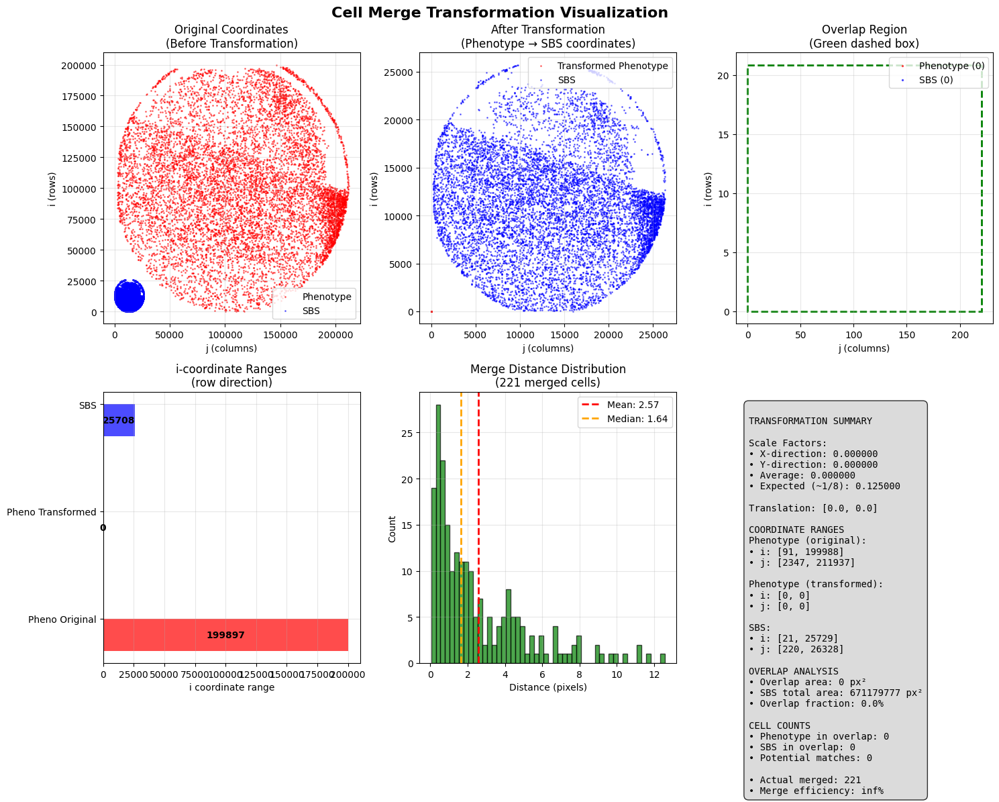

In [22]:
# Load your data (adjust paths as needed)
phenotype_pos = pd.read_parquet('/lab/ops_analysis/lourido/nebo-analysis/analysis/analysis_root/merge/cell_positions/P-1_W-A3__phenotype_cell_positions.parquet')
sbs_pos = pd.read_parquet('/lab/ops_analysis/lourido/nebo-analysis/analysis/analysis_root/merge/cell_positions/P-1_W-A3__sbs_cell_positions.parquet')
merged = pd.read_parquet('/lab/ops_analysis/lourido/nebo-analysis/analysis/analysis_root/merge/parquets/P-1_W-A3__merge.parquet')  # optional

# Use your actual alignment result
alignment = {
    'rotation': np.array([[0, 0], [00, 00]]),
    'translation': np.array([0, 0])
}

# Create the visualization
fig = visualize_transformation_overlap(phenotype_pos, sbs_pos, alignment, merged)

### Dedouplication

In [23]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.spatial.distance import cdist
import warnings
warnings.filterwarnings('ignore')

# Set plotting style
plt.style.use('default')
sns.set_palette("husl")

# Load your raw matches data (before deduplication)
raw_matches_file = "/lab/ops_analysis/lourido/nebo-analysis/analysis/analysis_root/merge/parquets/P-1_W-A3__enhanced_well_merge_raw_matches.parquet"  # UPDATE THIS PATH
raw_matches = pd.read_parquet(raw_matches_file)

# Load final matches data (after deduplication)
final_matches_file = "/lab/ops_analysis/lourido/nebo-analysis/analysis/analysis_root/merge/parquets/P-1_W-A3__merge.parquet"  # UPDATE THIS PATH
final_matches = pd.read_parquet(final_matches_file)

print(f"Raw matches: {len(raw_matches):,}")
print(f"Final matches: {len(final_matches):,}")
print(f"Lost in deduplication: {len(raw_matches) - len(final_matches):,}")
print(f"Loss rate: {100 * (len(raw_matches) - len(final_matches)) / len(raw_matches):.1f}%")

FileNotFoundError: [Errno 2] No such file or directory: '/lab/ops_analysis/lourido/nebo-analysis/analysis/analysis_root/merge/parquets/P-1_W-A3__enhanced_well_merge_raw_matches.parquet'

=== Phenotype Cell Duplication Statistics ===
Unique phenotype cells in raw matches: 115,192
Phenotype cells with multiple SBS matches: 32,266
Max SBS matches for one phenotype cell: 19


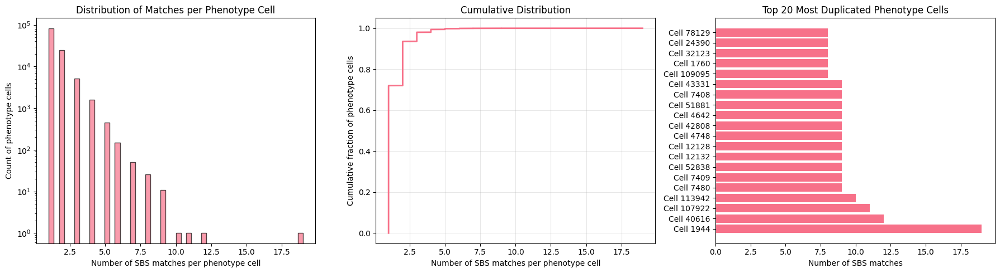


Key Statistics:
- Phenotype cells with 1 match: 82,926 (72.0%)
- Phenotype cells with 2-5 matches: 32,027
- Phenotype cells with 6-10 matches: 236
- Phenotype cells with >10 matches: 3


In [24]:
# Analyze phenotype cell duplication
pheno_counts = raw_matches['cell_0'].value_counts()

print("=== Phenotype Cell Duplication Statistics ===")
print(f"Unique phenotype cells in raw matches: {len(pheno_counts):,}")
print(f"Phenotype cells with multiple SBS matches: {(pheno_counts > 1).sum():,}")
print(f"Max SBS matches for one phenotype cell: {pheno_counts.max()}")

# Distribution of matches per phenotype cell
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

# Histogram of matches per phenotype cell
axes[0].hist(pheno_counts.values, bins=50, alpha=0.7, edgecolor='black')
axes[0].set_xlabel('Number of SBS matches per phenotype cell')
axes[0].set_ylabel('Count of phenotype cells')
axes[0].set_title('Distribution of Matches per Phenotype Cell')
axes[0].set_yscale('log')

# Cumulative distribution
sorted_counts = np.sort(pheno_counts.values)
cumulative = np.arange(1, len(sorted_counts) + 1) / len(sorted_counts)
axes[1].plot(sorted_counts, cumulative, linewidth=2)
axes[1].set_xlabel('Number of SBS matches per phenotype cell')
axes[1].set_ylabel('Cumulative fraction of phenotype cells')
axes[1].set_title('Cumulative Distribution')
axes[1].grid(True, alpha=0.3)

# Top duplicated phenotype cells
top_duplicated = pheno_counts.head(20)
axes[2].barh(range(len(top_duplicated)), top_duplicated.values)
axes[2].set_yticks(range(len(top_duplicated)))
axes[2].set_yticklabels([f"Cell {cell}" for cell in top_duplicated.index])
axes[2].set_xlabel('Number of SBS matches')
axes[2].set_title('Top 20 Most Duplicated Phenotype Cells')

plt.tight_layout()
plt.show()

# Key statistics
print(f"\nKey Statistics:")
print(f"- Phenotype cells with 1 match: {(pheno_counts == 1).sum():,} ({100*(pheno_counts == 1).sum()/len(pheno_counts):.1f}%)")
print(f"- Phenotype cells with 2-5 matches: {((pheno_counts >= 2) & (pheno_counts <= 5)).sum():,}")
print(f"- Phenotype cells with 6-10 matches: {((pheno_counts >= 6) & (pheno_counts <= 10)).sum():,}")
print(f"- Phenotype cells with >10 matches: {(pheno_counts > 10).sum():,}")

Single matches: 82,926
Multiple matches: 75,262


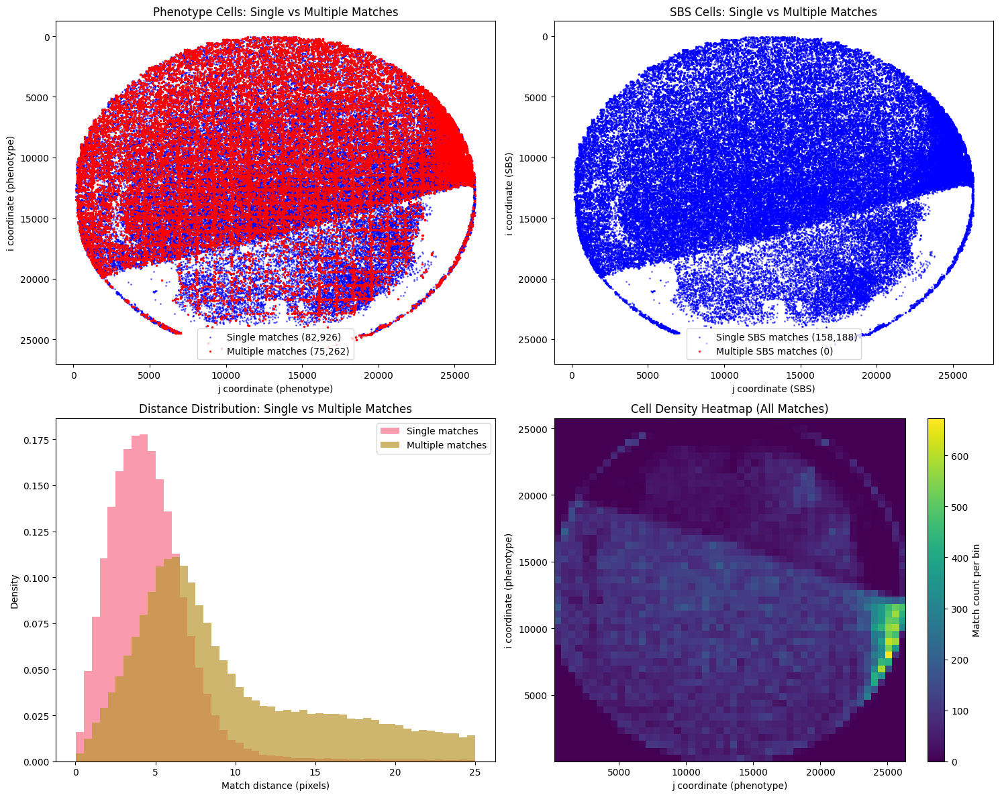

In [25]:
# Analyze where duplications are happening spatially
def analyze_spatial_duplications(raw_matches):
    """Analyze spatial patterns in cell duplications."""
    
    # Get phenotype cells with multiple matches
    pheno_counts = raw_matches['cell_0'].value_counts()
    multi_match_cells = pheno_counts[pheno_counts > 1].index
    
    # Separate single vs multiple matches
    single_matches = raw_matches[~raw_matches['cell_0'].isin(multi_match_cells)]
    multi_matches = raw_matches[raw_matches['cell_0'].isin(multi_match_cells)]
    
    print(f"Single matches: {len(single_matches):,}")
    print(f"Multiple matches: {len(multi_matches):,}")
    
    # Plot spatial distribution
    fig, axes = plt.subplots(2, 2, figsize=(15, 12))
    
    # Phenotype cells - single vs multiple matches
    axes[0, 0].scatter(single_matches['j_0'], single_matches['i_0'], 
                      c='blue', alpha=0.5, s=1, label=f'Single matches ({len(single_matches):,})')
    axes[0, 0].scatter(multi_matches['j_0'], multi_matches['i_0'], 
                      c='red', alpha=0.7, s=2, label=f'Multiple matches ({len(multi_matches):,})')
    axes[0, 0].set_xlabel('j coordinate (phenotype)')
    axes[0, 0].set_ylabel('i coordinate (phenotype)')
    axes[0, 0].set_title('Phenotype Cells: Single vs Multiple Matches')
    axes[0, 0].legend()
    axes[0, 0].invert_yaxis()
    
    # SBS cells - which ones are duplicates
    sbs_counts = raw_matches['cell_1'].value_counts()
    multi_sbs_cells = sbs_counts[sbs_counts > 1].index
    single_sbs = raw_matches[~raw_matches['cell_1'].isin(multi_sbs_cells)]
    multi_sbs = raw_matches[raw_matches['cell_1'].isin(multi_sbs_cells)]
    
    axes[0, 1].scatter(single_sbs['j_1'], single_sbs['i_1'], 
                      c='blue', alpha=0.5, s=1, label=f'Single SBS matches ({len(single_sbs):,})')
    axes[0, 1].scatter(multi_sbs['j_1'], multi_sbs['i_1'], 
                      c='red', alpha=0.7, s=2, label=f'Multiple SBS matches ({len(multi_sbs):,})')
    axes[0, 1].set_xlabel('j coordinate (SBS)')
    axes[0, 1].set_ylabel('i coordinate (SBS)')
    axes[0, 1].set_title('SBS Cells: Single vs Multiple Matches')
    axes[0, 1].legend()
    axes[0, 1].invert_yaxis()
    
    # Distance analysis for multi-matches
    multi_distances = multi_matches['distance']
    single_distances = single_matches['distance']
    
    axes[1, 0].hist(single_distances, bins=50, alpha=0.7, label='Single matches', density=True)
    axes[1, 0].hist(multi_distances, bins=50, alpha=0.7, label='Multiple matches', density=True)
    axes[1, 0].set_xlabel('Match distance (pixels)')
    axes[1, 0].set_ylabel('Density')
    axes[1, 0].set_title('Distance Distribution: Single vs Multiple Matches')
    axes[1, 0].legend()
    
    # Cell density heatmap
    # Create 2D histogram of phenotype cell positions
    H, xedges, yedges = np.histogram2d(raw_matches['j_0'], raw_matches['i_0'], bins=50)
    im = axes[1, 1].imshow(H.T, origin='lower', aspect='auto', cmap='viridis',
                          extent=[xedges[0], xedges[-1], yedges[0], yedges[-1]])
    axes[1, 1].set_xlabel('j coordinate (phenotype)')
    axes[1, 1].set_ylabel('i coordinate (phenotype)')
    axes[1, 1].set_title('Cell Density Heatmap (All Matches)')
    plt.colorbar(im, ax=axes[1, 1], label='Match count per bin')
    
    plt.tight_layout()
    plt.show()
    
    return single_matches, multi_matches

single_matches, multi_matches = analyze_spatial_duplications(raw_matches)


Phenotype Cell 1944 (19 matches):
  Position: (1211, 13646)
  Distance range: 6.94 - 24.99 px
  Best match distance: 6.94 px
  Worst match distance: 24.99 px
  Distance std: 5.68 px

Phenotype Cell 40616 (12 matches):
  Position: (9088, 25121)
  Distance range: 5.96 - 24.83 px
  Best match distance: 5.96 px
  Worst match distance: 24.83 px
  Distance std: 5.85 px

Phenotype Cell 107922 (11 matches):
  Position: (17255, 5791)
  Distance range: 4.72 - 23.63 px
  Best match distance: 4.72 px
  Worst match distance: 23.63 px
  Distance std: 5.94 px

Phenotype Cell 113942 (10 matches):
  Position: (18419, 1278)
  Distance range: 6.28 - 22.81 px
  Best match distance: 6.28 px
  Worst match distance: 22.81 px
  Distance std: 5.84 px

Phenotype Cell 7480 (9 matches):
  Position: (3423, 20006)
  Distance range: 3.06 - 24.01 px
  Best match distance: 3.06 px
  Worst match distance: 24.01 px
  Distance std: 7.14 px

Phenotype Cell 7409 (9 matches):
  Position: (3431, 21670)
  Distance range: 3.6

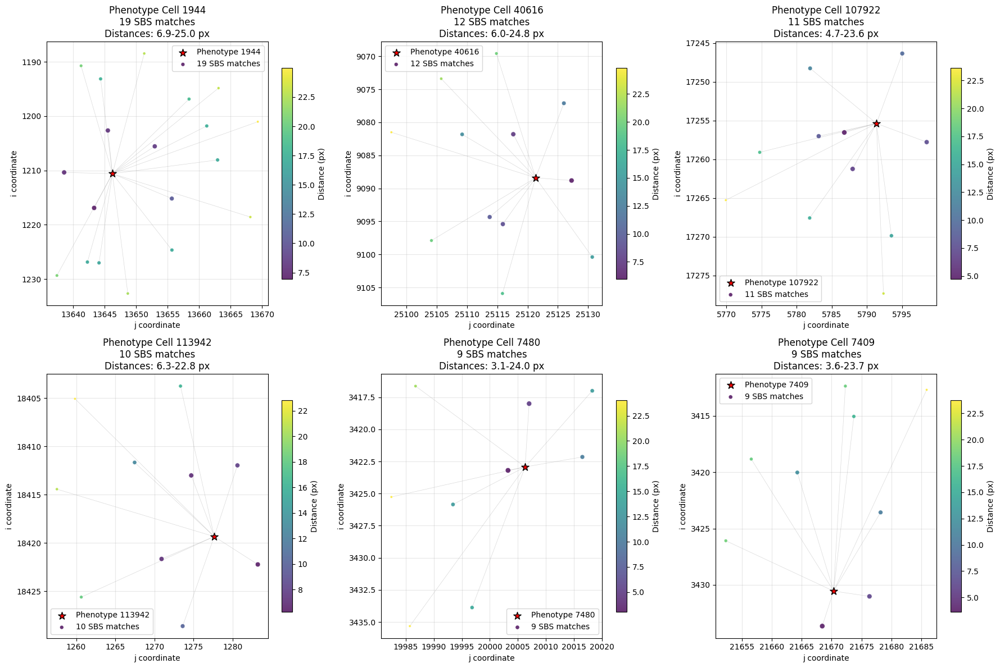

In [26]:
# Examine the most duplicated phenotype cells in detail
def analyze_top_duplicated_cells(raw_matches, top_n=5):
    """Analyze the most duplicated phenotype cells in detail."""
    
    pheno_counts = raw_matches['cell_0'].value_counts()
    top_cells = pheno_counts.head(top_n)
    
    fig, axes = plt.subplots(2, 3, figsize=(18, 12))
    axes = axes.flatten()
    
    for idx, (cell_id, count) in enumerate(top_cells.items()):
        if idx >= 6:
            break
            
        # Get all matches for this phenotype cell
        cell_matches = raw_matches[raw_matches['cell_0'] == cell_id].copy()
        cell_matches = cell_matches.sort_values('distance')
        
        ax = axes[idx]
        
        # Plot the phenotype cell and all its SBS matches
        pheno_i, pheno_j = cell_matches.iloc[0]['i_0'], cell_matches.iloc[0]['j_0']
        
        # Plot phenotype cell (large red dot)
        ax.scatter(pheno_j, pheno_i, c='red', s=100, marker='*', 
                  label=f'Phenotype {cell_id}', zorder=3, edgecolor='black', linewidth=1)
        
        # Plot all SBS matches (smaller blue dots, sized by distance)
        distances = cell_matches['distance'].values
        sizes = 50 - (distances / distances.max()) * 40  # Size inversely related to distance
        
        scatter = ax.scatter(cell_matches['j_1'], cell_matches['i_1'], 
                           c=distances, s=sizes, cmap='viridis', alpha=0.8,
                           label=f'{count} SBS matches', zorder=2, edgecolor='white', linewidth=0.5)
        
        # Add lines connecting phenotype to SBS cells
        for _, match in cell_matches.iterrows():
            ax.plot([pheno_j, match['j_1']], [pheno_i, match['i_1']], 
                   'gray', alpha=0.3, linewidth=0.5, zorder=1)
        
        # Formatting
        ax.set_xlabel('j coordinate')
        ax.set_ylabel('i coordinate')
        ax.set_title(f'Phenotype Cell {cell_id}\n{count} SBS matches\nDistances: {distances.min():.1f}-{distances.max():.1f} px')
        ax.legend()
        ax.grid(True, alpha=0.3)
        ax.invert_yaxis()
        
        # Add colorbar for distances
        plt.colorbar(scatter, ax=ax, label='Distance (px)', shrink=0.8)
        
        # Print details
        print(f"\nPhenotype Cell {cell_id} ({count} matches):")
        print(f"  Position: ({pheno_i:.0f}, {pheno_j:.0f})")
        print(f"  Distance range: {distances.min():.2f} - {distances.max():.2f} px")
        print(f"  Best match distance: {distances.min():.2f} px")
        print(f"  Worst match distance: {distances.max():.2f} px")
        print(f"  Distance std: {distances.std():.2f} px")
    
    # Hide unused subplots
    for idx in range(top_n, len(axes)):
        axes[idx].set_visible(False)
    
    plt.tight_layout()
    plt.show()

analyze_top_duplicated_cells(raw_matches, top_n=6)

In [27]:
# Analyze the quality of matches being lost
def analyze_lost_matches_quality(raw_matches, final_matches):
    """Analyze the quality of matches lost during deduplication."""
    
    # Identify which matches were kept vs lost
    final_match_pairs = set(zip(final_matches['cell_0'], final_matches['cell_1']))
    raw_matches['kept'] = [
        (row['cell_0'], row['cell_1']) in final_match_pairs 
        for _, row in raw_matches.iterrows()
    ]
    
    kept_matches = raw_matches[raw_matches['kept']]
    lost_matches = raw_matches[~raw_matches['kept']]
    
    print(f"Kept matches: {len(kept_matches):,}")
    print(f"Lost matches: {len(lost_matches):,}")
    
    fig, axes = plt.subplots(2, 2, figsize=(15, 10))
    
    # Distance comparison
    axes[0, 0].hist(kept_matches['distance'], bins=50, alpha=0.7, label=f'Kept ({len(kept_matches):,})', density=True)
    axes[0, 0].hist(lost_matches['distance'], bins=50, alpha=0.7, label=f'Lost ({len(lost_matches):,})', density=True)
    axes[0, 0].set_xlabel('Distance (pixels)')
    axes[0, 0].set_ylabel('Density')
    axes[0, 0].set_title('Distance Distribution: Kept vs Lost Matches')
    axes[0, 0].legend()
    axes[0, 0].axvline(kept_matches['distance'].mean(), color='blue', linestyle='--', 
                      label=f'Kept mean: {kept_matches["distance"].mean():.2f}')
    axes[0, 0].axvline(lost_matches['distance'].mean(), color='orange', linestyle='--', 
                      label=f'Lost mean: {lost_matches["distance"].mean():.2f}')
    
    # Box plot comparison
    distance_data = [kept_matches['distance'], lost_matches['distance']]
    axes[0, 1].boxplot(distance_data, labels=['Kept', 'Lost'])
    axes[0, 1].set_ylabel('Distance (pixels)')
    axes[0, 1].set_title('Distance Distribution Box Plot')
    axes[0, 1].grid(True, alpha=0.3)
    
    # Spatial distribution of lost matches
    axes[1, 0].scatter(kept_matches['j_0'], kept_matches['i_0'], 
                      c='blue', alpha=0.3, s=1, label='Kept matches')
    axes[1, 0].scatter(lost_matches['j_0'], lost_matches['i_0'], 
                      c='red', alpha=0.5, s=1, label='Lost matches')
    axes[1, 0].set_xlabel('j coordinate (phenotype)')
    axes[1, 0].set_ylabel('i coordinate (phenotype)')
    axes[1, 0].set_title('Spatial Distribution: Kept vs Lost')
    axes[1, 0].legend()
    axes[1, 0].invert_yaxis()
    
    # Quality metrics comparison
    print(f"\n=== Quality Comparison ===")
    print(f"Kept matches:")
    print(f"  Mean distance: {kept_matches['distance'].mean():.3f} ± {kept_matches['distance'].std():.3f}")
    print(f"  Median distance: {kept_matches['distance'].median():.3f}")
    print(f"  Max distance: {kept_matches['distance'].max():.3f}")
    print(f"  Min distance: {kept_matches['distance'].min():.3f}")
    
    print(f"\nLost matches:")
    print(f"  Mean distance: {lost_matches['distance'].mean():.3f} ± {lost_matches['distance'].std():.3f}")
    print(f"  Median distance: {lost_matches['distance'].median():.3f}")
    print(f"  Max distance: {lost_matches['distance'].max():.3f}")
    print(f"  Min distance: {lost_matches['distance'].min():.3f}")
    
    # Distance percentiles for lost matches
    lost_distances = lost_matches['distance']
    percentiles = [25, 50, 75, 90, 95, 99]
    print(f"\nLost matches distance percentiles:")
    for p in percentiles:
        print(f"  {p}th percentile: {np.percentile(lost_distances, p):.3f}")
    
    # Plot cumulative distribution of lost match distances
    sorted_lost_distances = np.sort(lost_distances)
    cumulative = np.arange(1, len(sorted_lost_distances) + 1) / len(sorted_lost_distances)
    axes[1, 1].plot(sorted_lost_distances, cumulative, linewidth=2, color='red')
    axes[1, 1].set_xlabel('Distance (pixels)')
    axes[1, 1].set_ylabel('Cumulative fraction')
    axes[1, 1].set_title('Cumulative Distribution of Lost Match Distances')
    axes[1, 1].grid(True, alpha=0.3)
    
    # Add percentile lines
    for p in [25, 50, 75, 90, 95]:
        dist_val = np.percentile(lost_distances, p)
        axes[1, 1].axvline(dist_val, color='gray', linestyle='--', alpha=0.7)
        axes[1, 1].text(dist_val, p/100, f'{p}%', rotation=90, va='bottom')
    
    plt.tight_layout()
    plt.show()
    
    return kept_matches, lost_matches

kept_matches, lost_matches = analyze_lost_matches_quality(raw_matches, final_matches)

NameError: name 'final_matches' is not defined

In [ ]:
# Generate recommendations based on the analysis
def generate_recommendations(raw_matches, lost_matches, pheno_counts):
    """Generate recommendations for improving the deduplication strategy."""
    
    print("=== DEDUPLICATION ANALYSIS SUMMARY ===\n")
    
    # Basic statistics
    total_matches = len(raw_matches)
    lost_count = len(lost_matches)
    loss_rate = 100 * lost_count / total_matches
    
    print(f"📊 Overall Statistics:")
    print(f"   • Total raw matches: {total_matches:,}")
    print(f"   • Matches lost: {lost_count:,} ({loss_rate:.1f}%)")
    print(f"   • Matches kept: {total_matches - lost_count:,}")
    
    # Duplication analysis
    multi_match_cells = (pheno_counts > 1).sum()
    avg_matches_per_multi = pheno_counts[pheno_counts > 1].mean()
    
    print(f"\n🔄 Duplication Patterns:")
    print(f"   • Phenotype cells with multiple matches: {multi_match_cells:,}")
    print(f"   • Average matches per multi-match cell: {avg_matches_per_multi:.1f}")
    print(f"   • Max matches for one cell: {pheno_counts.max()}")
    
    # Distance quality
    lost_mean_dist = lost_matches['distance'].mean()
    kept_mean_dist = raw_matches[raw_matches['cell_0'].isin(pheno_counts[pheno_counts == 1].index)]['distance'].mean()
    
    print(f"\n📏 Distance Quality:")
    print(f"   • Mean distance of lost matches: {lost_mean_dist:.2f} px")
    print(f"   • Mean distance of single matches: {kept_mean_dist:.2f} px")
    print(f"   • Quality difference: {lost_mean_dist - kept_mean_dist:+.2f} px")
    
    # Generate specific recommendations
    print(f"\n💡 RECOMMENDATIONS:\n")
    
    if loss_rate > 80:
        print("🚨 CRITICAL: Very high loss rate (>80%)!")
        print("   → Consider allowing multiple matches per phenotype cell")
        print("   → Or switch to SBS-centric deduplication")
    
    if lost_mean_dist < kept_mean_dist + 1.0:
        print("✅ GOOD: Lost matches have similar quality to kept matches")
        print("   → Safe to allow more matches per cell")
    else:
        print("⚠️  CAUTION: Lost matches have notably worse distances")
        print("   → Current deduplication is filtering out lower-quality matches")
    
    if avg_matches_per_multi > 5:
        print("🎯 HIGH DENSITY: Very dense cell regions detected")
        print("   → Consider distance-based filtering before deduplication")
        print("   → Or implement local density-aware matching")
    
    # Specific strategies
    print(f"\n🔧 STRATEGY OPTIONS:\n")
    
    print("1. ALLOW MULTIPLE MATCHES:")
    print("   • Keep top N matches per phenotype cell")
    print("   • Pros: Higher yield, preserves good matches")
    print("   • Cons: Some cells may be double-counted")
    
    print("\n2. SBS-CENTRIC DEDUPLICATION:")
    print("   • Remove duplicate SBS cells instead of phenotype cells")
    print("   • Each SBS cell matches to only one phenotype cell")
    print("   • May give different but valid results")
    
    print("\n3. DISTANCE-BASED HYBRID:")
    print("   • Allow multiple matches only if distance < threshold")
    print("   • E.g., allow 2-3 matches per phenotype if all < 3.0 px")
    
    print("\n4. NO DEDUPLICATION:")
    print("   • Keep all matches, handle duplicates downstream")
    print("   • Let analysis tools decide how to handle multiple matches")
    
    # Provide code snippets for top recommendations
    good_distance_threshold = np.percentile(lost_matches['distance'], 25)  # Bottom 25% of lost matches
    
    print(f"\n📝 CODE SUGGESTIONS:\n")
    
    print(f"# Option 1: Allow up to 3 matches per phenotype cell")
    print(f"merged_cells = merged_cells_raw.sort_values('distance').groupby('cell_0').head(3)")
    
    print(f"\n# Option 2: SBS-centric deduplication")
    print(f"merged_cells = merged_cells_raw.sort_values('distance').drop_duplicates('cell_1', keep='first')")
    
    print(f"\n# Option 3: Distance-based filtering (allow multiples if good quality)")
    print(f"# Keep best match + any others within {good_distance_threshold:.1f} pixels")
    print(f"def smart_dedup(group):")
    print(f"    group = group.sort_values('distance')")
    print(f"    best = group.iloc[[0]]  # Always keep best match")
    print(f"    others = group.iloc[1:][group.iloc[1:]['distance'] < {good_distance_threshold:.1f}]")
    print(f"    return pd.concat([best, others])")
    print(f"merged_cells = merged_cells_raw.groupby('cell_0').apply(smart_dedup)")

# Run the recommendations
pheno_counts = raw_matches['cell_0'].value_counts()
generate_recommendations(raw_matches, lost_matches, pheno_counts)

NameError: name 'lost_matches' is not defined

=== TESTING ALTERNATIVE STRATEGIES ===

Strategy Comparison:
       strategy  total_matches  unique_phenotype  unique_sbs  mean_distance  median_distance  max_distance
        current         115192            115192      115192       4.760567         4.509003     24.995372
top_2_per_pheno         147458            115192      147458       6.304321         5.278711     24.999876
top_3_per_pheno         154844            115192      154844       6.737476         5.460538     24.999876
    sbs_centric         158188            115192      158188       6.967454         5.539863     24.999876
 distance_based         115197            115192      115197       4.760466         4.508819     24.995372
       no_dedup         158188            115192      158188       6.967454         5.539863     24.999876


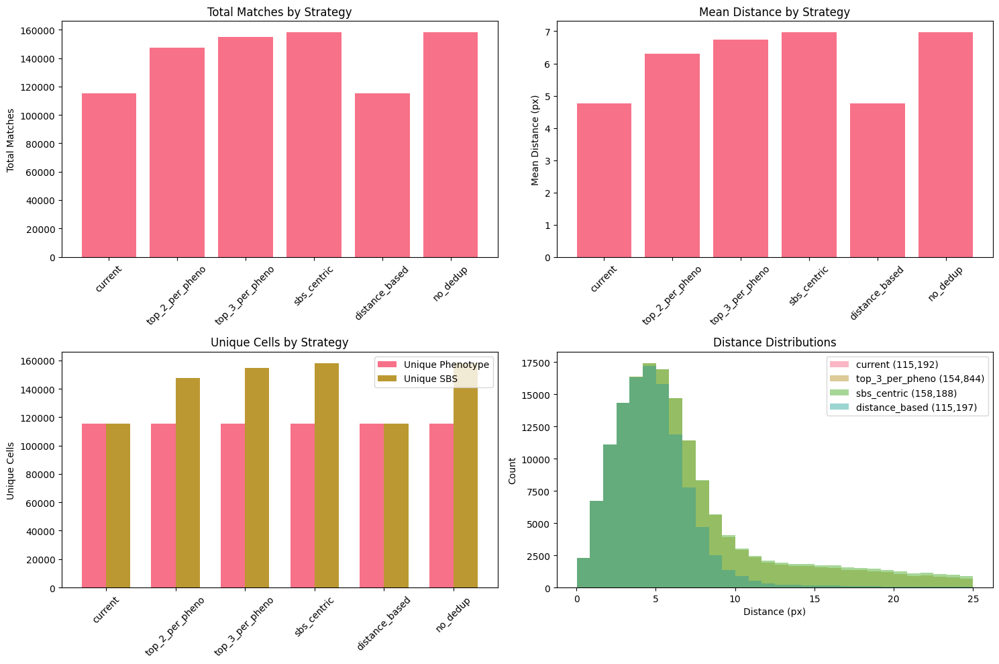

In [12]:
# Test different deduplication strategies
def test_deduplication_strategies(raw_matches):
    """Test and compare different deduplication strategies."""
    
    print("=== TESTING ALTERNATIVE STRATEGIES ===\n")
    
    strategies = {}
    
    # Current strategy: Keep best match per phenotype cell
    strategies['current'] = raw_matches.sort_values('distance').drop_duplicates('cell_0', keep='first')
    
    # Strategy 1: Keep top 2 matches per phenotype cell
    strategies['top_2_per_pheno'] = raw_matches.sort_values('distance').groupby('cell_0').head(2)
    
    # Strategy 2: Keep top 3 matches per phenotype cell
    strategies['top_3_per_pheno'] = raw_matches.sort_values('distance').groupby('cell_0').head(3)
    
    # Strategy 3: SBS-centric (one phenotype per SBS cell)
    strategies['sbs_centric'] = raw_matches.sort_values('distance').drop_duplicates('cell_1', keep='first')
    
    # Strategy 4: Distance threshold (allow multiples if close)
    def distance_based_dedup(group, threshold=3.0):
        group = group.sort_values('distance')
        best = group.iloc[[0]]  # Always keep best
        others = group.iloc[1:][group.iloc[1:]['distance'] < threshold]
        return pd.concat([best, others])
    
    strategies['distance_based'] = raw_matches.groupby('cell_0').apply(
        lambda x: distance_based_dedup(x, threshold=3.0)
    ).reset_index(drop=True)
    
    # Strategy 5: No deduplication
    strategies['no_dedup'] = raw_matches.copy()
    
    # Compare strategies
    results = []
    for name, matches in strategies.items():
        results.append({
            'strategy': name,
            'total_matches': len(matches),
            'unique_phenotype': matches['cell_0'].nunique(),
            'unique_sbs': matches['cell_1'].nunique(),
            'mean_distance': matches['distance'].mean(),
            'median_distance': matches['distance'].median(),
            'max_distance': matches['distance'].max()
        })
    
    results_df = pd.DataFrame(results)
    
    print("Strategy Comparison:")
    print(results_df.to_string(index=False))
    
    # Visualize comparison
    fig, axes = plt.subplots(2, 2, figsize=(15, 10))
    
    # Total matches
    axes[0, 0].bar(results_df['strategy'], results_df['total_matches'])
    axes[0, 0].set_ylabel('Total Matches')
    axes[0, 0].set_title('Total Matches by Strategy')
    axes[0, 0].tick_params(axis='x', rotation=45)
    
    # Mean distance
    axes[0, 1].bar(results_df['strategy'], results_df['mean_distance'])
    axes[0, 1].set_ylabel('Mean Distance (px)')
    axes[0, 1].set_title('Mean Distance by Strategy')
    axes[0, 1].tick_params(axis='x', rotation=45)
    
    # Unique cells comparison
    width = 0.35
    x = np.arange(len(results_df))
    axes[1, 0].bar(x - width/2, results_df['unique_phenotype'], width, label='Unique Phenotype')
    axes[1, 0].bar(x + width/2, results_df['unique_sbs'], width, label='Unique SBS')
    axes[1, 0].set_ylabel('Unique Cells')
    axes[1, 0].set_title('Unique Cells by Strategy')
    axes[1, 0].set_xticks(x)
    axes[1, 0].set_xticklabels(results_df['strategy'], rotation=45)
    axes[1, 0].legend()
    
    # Distance distributions for top strategies
    top_strategies = ['current', 'top_3_per_pheno', 'sbs_centric', 'distance_based']
    for i, strategy in enumerate(top_strategies):
        if strategy in strategies:
            axes[1, 1].hist(strategies[strategy]['distance'], bins=30, alpha=0.5, 
                           label=f'{strategy} ({len(strategies[strategy]):,})')
    
    axes[1, 1].set_xlabel('Distance (px)')
    axes[1, 1].set_ylabel('Count')
    axes[1, 1].set_title('Distance Distributions')
    axes[1, 1].legend()
    
    plt.tight_layout()
    plt.show()
    
    return strategies, results_df

strategies, results_df = test_deduplication_strategies(raw_matches)

In [7]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

def debug_coordinate_mismatch(
    phenotype_scaled,           # Input to matching: scaled phenotype positions
    phenotype_transformed,      # Input to matching: transformed phenotype positions  
    sbs_positions,             # Input to matching: SBS positions
    raw_matches,               # Output from matching: with stored coordinates
    sample_size=1000,
    figsize=(20, 15)
):
    """
    Debug the coordinate mismatch between distance calculation and stored coordinates.
    
    This visualization will help identify exactly where the coordinate system mismatch occurs.
    """
    
    # Sample some matches for detailed analysis
    if len(raw_matches) > sample_size:
        matches_sample = raw_matches.sample(n=sample_size, random_state=42)
    else:
        matches_sample = raw_matches
    
    # Create figure
    fig, axes = plt.subplots(3, 4, figsize=figsize)
    fig.suptitle('Coordinate Mismatch Debugging', fontsize=16, fontweight='bold')
    
    # ========== ROW 1: INPUT COORDINATE SYSTEMS ==========
    
    # 1.1 Phenotype Scaled (Input)
    ax = axes[0, 0]
    ax.scatter(phenotype_scaled['j'], phenotype_scaled['i'], 
               c='lightcoral', s=0.5, alpha=0.5, label='All cells')
    ax.set_title(f'Phenotype Scaled (Input)\n{len(phenotype_scaled):,} cells')
    ax.set_xlabel('j coordinate')
    ax.set_ylabel('i coordinate')
    
    # Add coordinate range text
    i_range = f"i: [{phenotype_scaled['i'].min():.0f}, {phenotype_scaled['i'].max():.0f}]"
    j_range = f"j: [{phenotype_scaled['j'].min():.0f}, {phenotype_scaled['j'].max():.0f}]"
    ax.text(0.02, 0.98, f"{i_range}\n{j_range}", transform=ax.transAxes, 
            verticalalignment='top', fontsize=8, bbox=dict(boxstyle="round,pad=0.3", facecolor="white", alpha=0.8))
    
    # 1.2 Phenotype Transformed (Input)  
    ax = axes[0, 1]
    ax.scatter(phenotype_transformed['j'], phenotype_transformed['i'], 
               c='red', s=0.5, alpha=0.5, label='All cells')
    ax.set_title(f'Phenotype Transformed (Input)\n{len(phenotype_transformed):,} cells')
    ax.set_xlabel('j coordinate')
    ax.set_ylabel('i coordinate')
    
    # Add coordinate range text
    i_range = f"i: [{phenotype_transformed['i'].min():.0f}, {phenotype_transformed['i'].max():.0f}]"
    j_range = f"j: [{phenotype_transformed['j'].min():.0f}, {phenotype_transformed['j'].max():.0f}]"
    ax.text(0.02, 0.98, f"{i_range}\n{j_range}", transform=ax.transAxes, 
            verticalalignment='top', fontsize=8, bbox=dict(boxstyle="round,pad=0.3", facecolor="white", alpha=0.8))
    
    # 1.3 SBS Positions (Input)
    ax = axes[0, 2]
    ax.scatter(sbs_positions['j'], sbs_positions['i'], 
               c='lightblue', s=0.5, alpha=0.5, label='All cells')
    ax.set_title(f'SBS Positions (Input)\n{len(sbs_positions):,} cells')
    ax.set_xlabel('j coordinate')
    ax.set_ylabel('i coordinate')
    
    # Add coordinate range text
    i_range = f"i: [{sbs_positions['i'].min():.0f}, {sbs_positions['i'].max():.0f}]"
    j_range = f"j: [{sbs_positions['j'].min():.0f}, {sbs_positions['j'].max():.0f}]"
    ax.text(0.02, 0.98, f"{i_range}\n{j_range}", transform=ax.transAxes, 
            verticalalignment='top', fontsize=8, bbox=dict(boxstyle="round,pad=0.3", facecolor="white", alpha=0.8))
    
    # 1.4 Expected vs Actual Distance Calculation
    ax = axes[0, 3]
    ax.axis('off')
    ax.text(0.05, 0.95, 
            "DISTANCE CALCULATION ANALYSIS\n\n"
            "The matching algorithm should use:\n"
            "• Phenotype: transformed coordinates\n"
            "• SBS: original coordinates\n\n"
            "Distance = √[(SBS_i - Pheno_i)² + (SBS_j - Pheno_j)²]\n\n"
            "Question: Are these coordinate systems\n"
            "actually compatible?",
            transform=ax.transAxes, fontsize=10, verticalalignment='top',
            bbox=dict(boxstyle="round,pad=0.5", facecolor="lightyellow", alpha=0.8))
    
    # ========== ROW 2: STORED COORDINATES FROM MATCHES ==========
    
    # 2.1 Stored Phenotype Coordinates (i_0, j_0)
    ax = axes[1, 0]
    ax.scatter(matches_sample['j_0'], matches_sample['i_0'], 
               c='red', s=2, alpha=0.7, label='Stored phenotype coords')
    ax.set_title(f'Stored Phenotype Coords (i_0, j_0)\n{len(matches_sample):,} matches')
    ax.set_xlabel('j_0 coordinate')
    ax.set_ylabel('i_0 coordinate')
    
    # Add coordinate range text
    i_range = f"i_0: [{matches_sample['i_0'].min():.0f}, {matches_sample['i_0'].max():.0f}]"
    j_range = f"j_0: [{matches_sample['j_0'].min():.0f}, {matches_sample['j_0'].max():.0f}]"
    ax.text(0.02, 0.98, f"{i_range}\n{j_range}", transform=ax.transAxes, 
            verticalalignment='top', fontsize=8, bbox=dict(boxstyle="round,pad=0.3", facecolor="white", alpha=0.8))
    
    # 2.2 Stored SBS Coordinates (i_1, j_1)  
    ax = axes[1, 1]
    ax.scatter(matches_sample['j_1'], matches_sample['i_1'], 
               c='blue', s=2, alpha=0.7, label='Stored SBS coords')
    ax.set_title(f'Stored SBS Coords (i_1, j_1)\n{len(matches_sample):,} matches')
    ax.set_xlabel('j_1 coordinate')
    ax.set_ylabel('i_1 coordinate')
    
    # Add coordinate range text
    i_range = f"i_1: [{matches_sample['i_1'].min():.0f}, {matches_sample['i_1'].max():.0f}]"
    j_range = f"j_1: [{matches_sample['j_1'].min():.0f}, {matches_sample['j_1'].max():.0f}]"
    ax.text(0.02, 0.98, f"{i_range}\n{j_range}", transform=ax.transAxes, 
            verticalalignment='top', fontsize=8, bbox=dict(boxstyle="round,pad=0.3", facecolor="white", alpha=0.8))
    
    # 2.3 Overlay of Stored Coordinates
    ax = axes[1, 2]
    ax.scatter(matches_sample['j_0'], matches_sample['i_0'], 
               c='red', s=2, alpha=0.7, label='Phenotype (i_0, j_0)')
    ax.scatter(matches_sample['j_1'], matches_sample['i_1'], 
               c='blue', s=2, alpha=0.7, label='SBS (i_1, j_1)')
    ax.set_title('Stored Coordinates Overlay')
    ax.set_xlabel('j coordinate')
    ax.set_ylabel('i coordinate')
    ax.legend()
    
    # 2.4 Distance Analysis
    ax = axes[1, 3]
    
    # Calculate manual distances
    manual_distances = np.sqrt((matches_sample['i_1'] - matches_sample['i_0'])**2 + 
                              (matches_sample['j_1'] - matches_sample['j_0'])**2)
    stored_distances = matches_sample['distance']
    
    # Scatter plot: stored vs manual
    ax.scatter(stored_distances, manual_distances, alpha=0.5, s=1)
    ax.plot([0, stored_distances.max()], [0, stored_distances.max()], 'r--', alpha=0.5, label='Perfect match')
    ax.set_xlabel('Stored Distance')
    ax.set_ylabel('Manual Distance')
    ax.set_title('Stored vs Manual Distance')
    ax.legend()
    
    # Add ratio text
    ratio = manual_distances.mean() / stored_distances.mean()
    ax.text(0.05, 0.95, f"Ratio: {ratio:.1f}x\nStored: {stored_distances.mean():.1f}px\nManual: {manual_distances.mean():.1f}px", 
            transform=ax.transAxes, verticalalignment='top', fontsize=8,
            bbox=dict(boxstyle="round,pad=0.3", facecolor="white", alpha=0.8))
    
    # ========== ROW 3: COORDINATE SYSTEM COMPARISON ==========
    
    # 3.1 Which phenotype coordinates match stored i_0, j_0?
    ax = axes[2, 0]
    
    # Check if stored coordinates match scaled or transformed
    # Rename columns to avoid conflicts
    pheno_scaled_renamed = phenotype_scaled[['cell', 'i', 'j']].rename(columns={'i': 'i_scaled', 'j': 'j_scaled'})
    pheno_trans_renamed = phenotype_transformed[['cell', 'i', 'j']].rename(columns={'i': 'i_trans', 'j': 'j_trans'})
    
    matches_with_scaled = matches_sample.merge(pheno_scaled_renamed, left_on='cell_0', right_on='cell', how='left')
    matches_with_transformed = matches_sample.merge(pheno_trans_renamed, left_on='cell_0', right_on='cell', how='left')
    
    # Check distances between stored and source coordinates
    if len(matches_with_scaled) > 0 and 'i_scaled' in matches_with_scaled.columns:
        scaled_diff = np.sqrt((matches_with_scaled['i_0'] - matches_with_scaled['i_scaled'])**2 + 
                             (matches_with_scaled['j_0'] - matches_with_scaled['j_scaled'])**2)
        avg_scaled_diff = scaled_diff.mean()
    else:
        avg_scaled_diff = float('inf')
    
    if len(matches_with_transformed) > 0 and 'i_trans' in matches_with_transformed.columns:
        trans_diff = np.sqrt((matches_with_transformed['i_0'] - matches_with_transformed['i_trans'])**2 + 
                            (matches_with_transformed['j_0'] - matches_with_transformed['j_trans'])**2)
        avg_trans_diff = trans_diff.mean()
    else:
        avg_trans_diff = float('inf')
    
    # Plot comparison
    categories = ['Scaled→Stored', 'Transformed→Stored']
    differences = [avg_scaled_diff, avg_trans_diff]
    colors = ['lightcoral' if avg_scaled_diff < avg_trans_diff else 'lightgray',
              'red' if avg_trans_diff < avg_scaled_diff else 'lightgray']
    
    bars = ax.bar(categories, differences, color=colors)
    ax.set_ylabel('Average Coordinate Difference')
    ax.set_title('Phenotype Coordinate Source')
    ax.set_yscale('log')
    
    # Add value labels
    for bar, val in zip(bars, differences):
        ax.text(bar.get_x() + bar.get_width()/2, bar.get_height(), 
                f'{val:.2f}', ha='center', va='bottom')
    
    # 3.2 Which SBS coordinates match stored i_1, j_1?
    ax = axes[2, 1]
    
    # Check if stored SBS coordinates match original SBS coordinates  
    sbs_renamed = sbs_positions[['cell', 'i', 'j']].rename(columns={'i': 'i_orig', 'j': 'j_orig'})
    matches_with_sbs = matches_sample.merge(sbs_renamed, left_on='cell_1', right_on='cell', how='left')
    
    if len(matches_with_sbs) > 0 and 'i_orig' in matches_with_sbs.columns:
        sbs_diff = np.sqrt((matches_with_sbs['i_1'] - matches_with_sbs['i_orig'])**2 + 
                          (matches_with_sbs['j_1'] - matches_with_sbs['j_orig'])**2)
        
        ax.hist(sbs_diff, bins=50, alpha=0.7, color='lightblue')
        ax.set_xlabel('Coordinate Difference')
        ax.set_ylabel('Count')
        ax.set_title(f'SBS Stored vs Original\nMean diff: {sbs_diff.mean():.3f}')
        
        if sbs_diff.mean() < 0.001:
            ax.text(0.5, 0.8, 'PERFECT MATCH\n(stored = original)', 
                   transform=ax.transAxes, ha='center', fontsize=10,
                   bbox=dict(boxstyle="round,pad=0.3", facecolor="lightgreen", alpha=0.8))
    else:
        ax.text(0.5, 0.5, 'No SBS coordinate\ncomparison available', 
               transform=ax.transAxes, ha='center', va='center', fontsize=10)
    # 3.3 Coordinate System Diagnosis
    ax = axes[2, 2]
    ax.axis('off')
    
    # Determine which coordinate system is being used
    pheno_source = "TRANSFORMED" if avg_trans_diff < avg_scaled_diff else "SCALED"
    
    # Handle sbs_diff safely
    sbs_diff_text = f"{sbs_diff.mean():.6f}" if 'sbs_diff' in locals() and len(sbs_diff) > 0 else "N/A"
    
    diagnosis_text = f"""COORDINATE SYSTEM DIAGNOSIS

Phenotype coordinates (i_0, j_0):
• Source: {pheno_source} coordinates
• Diff from scaled: {avg_scaled_diff:.3f}
• Diff from transformed: {avg_trans_diff:.3f}

SBS coordinates (i_1, j_1):
• Source: ORIGINAL coordinates
• Diff from original: {sbs_diff_text}

Expected distance calculation:
• Should use: {pheno_source} phenotype + ORIGINAL SBS
• Coordinate compatibility: {'✓' if avg_trans_diff < 1.0 else '✗'}

Coordinate scale ratio:
• Manual/Stored distance: {ratio:.1f}x
• This suggests coordinates are in 
  different scales by factor ~{ratio:.0f}
"""
    
    ax.text(0.05, 0.95, diagnosis_text, transform=ax.transAxes, 
            fontsize=9, verticalalignment='top', fontfamily='monospace',
            bbox=dict(boxstyle="round,pad=0.5", facecolor="lightyellow", alpha=0.9))
    
    # 3.4 Solution Recommendation
    ax = axes[2, 3]
    ax.axis('off')
    
    if ratio > 10:  # Large ratio suggests coordinate system mismatch
        solution_text = f"""SOLUTION RECOMMENDATION

PROBLEM IDENTIFIED:
• Large distance ratio ({ratio:.0f}x) indicates
  coordinate system mismatch

LIKELY CAUSE:
• Phenotype coords: {pheno_source} scale
• SBS coords: ORIGINAL scale
• These scales are incompatible

SOLUTION:
• Ensure both coordinate systems
  are in the same scale before
  distance calculation
• OR convert stored coordinates
  to consistent scale

NEXT STEPS:
1. Check scale factor application
2. Verify coordinate transformations
3. Ensure both datasets use same
   coordinate reference system
"""
    else:
        solution_text = f"""SOLUTION RECOMMENDATION

STATUS: COORDINATES LOOK COMPATIBLE
• Distance ratio: {ratio:.1f}x (acceptable)
• Coordinate systems appear aligned

IF DISTANCES STILL WRONG:
• Check distance calculation logic
• Verify threshold application
• Check for index mismatches

COORDINATES APPEAR CORRECT
"""
    
    ax.text(0.05, 0.95, solution_text, transform=ax.transAxes, 
            fontsize=9, verticalalignment='top', fontfamily='monospace',
            bbox=dict(boxstyle="round,pad=0.5", 
                     facecolor="lightcoral" if ratio > 10 else "lightgreen", alpha=0.9))
    
    plt.tight_layout()
    plt.show()
    
    return fig, {
        'avg_scaled_diff': avg_scaled_diff,
        'avg_trans_diff': avg_trans_diff, 
        'distance_ratio': ratio,
        'pheno_source': pheno_source,
        'coordinate_compatible': avg_trans_diff < 1.0
    }

# Usage:
"""
# Load your data
phenotype_scaled = pd.read_parquet('analysis_root/merge/well_alignment/P-1_W-A3__phenotype_scaled.parquet')
phenotype_transformed = pd.read_parquet('analysis_root/merge/well_alignment/P-1_W-A3__phenotype_transformed.parquet')
sbs_positions = pd.read_parquet('analysis_root/merge/cell_positions/P-1_W-A3__sbs_cell_positions.parquet')
raw_matches = pd.read_parquet('analysis_root/merge/well_cell_merge/P-1_W-A3__raw_matches.parquet')

# Debug the mismatch
fig, diagnosis = debug_coordinate_mismatch(
    phenotype_scaled, 
    phenotype_transformed, 
    sbs_positions, 
    raw_matches
)

print("Diagnosis results:", diagnosis)
"""

'\n# Load your data\nphenotype_scaled = pd.read_parquet(\'analysis_root/merge/well_alignment/P-1_W-A3__phenotype_scaled.parquet\')\nphenotype_transformed = pd.read_parquet(\'analysis_root/merge/well_alignment/P-1_W-A3__phenotype_transformed.parquet\')\nsbs_positions = pd.read_parquet(\'analysis_root/merge/cell_positions/P-1_W-A3__sbs_cell_positions.parquet\')\nraw_matches = pd.read_parquet(\'analysis_root/merge/well_cell_merge/P-1_W-A3__raw_matches.parquet\')\n\n# Debug the mismatch\nfig, diagnosis = debug_coordinate_mismatch(\n    phenotype_scaled, \n    phenotype_transformed, \n    sbs_positions, \n    raw_matches\n)\n\nprint("Diagnosis results:", diagnosis)\n'

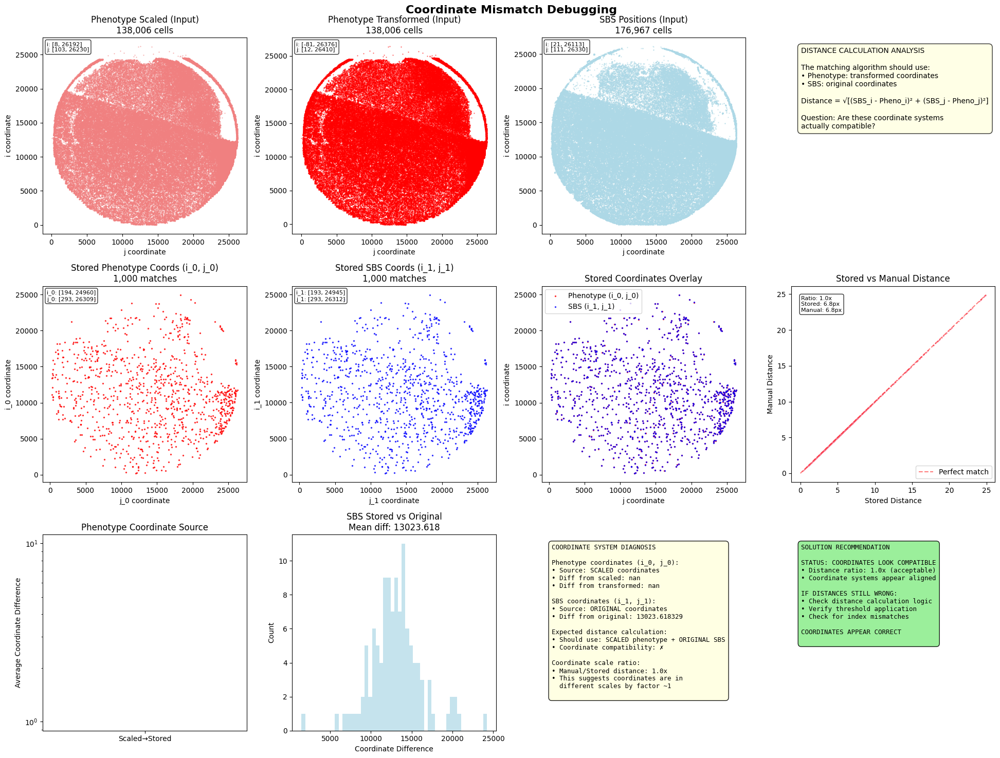

Diagnosis results: {'avg_scaled_diff': nan, 'avg_trans_diff': nan, 'distance_ratio': np.float64(1.0), 'pheno_source': 'SCALED', 'coordinate_compatible': False}


In [8]:
# Load your data
phenotype_scaled = pd.read_parquet('analysis_root/merge/well_alignment/P-1_W-A3__phenotype_scaled.parquet')
phenotype_transformed = pd.read_parquet('analysis_root/merge/well_alignment/P-1_W-A3__phenotype_transformed.parquet')
sbs_positions = pd.read_parquet('analysis_root/merge/cell_positions/P-1_W-A3__sbs_cell_positions.parquet')
raw_matches = pd.read_parquet('analysis_root/merge/well_cell_merge/P-1_W-A3__raw_matches.parquet')

# Debug the mismatch
fig, diagnosis = debug_coordinate_mismatch(
    phenotype_scaled, 
    phenotype_transformed, 
    sbs_positions, 
    raw_matches
)

print("Diagnosis results:", diagnosis)


In [ ]:
display(phenotype_transformed)

,well,stitched_cell_id,i,j,area,data_type,cell,original_cell_id,original_tile_id,tile,tile_i,tile_j,mapping_method,stage_x,stage_y,tile_row,tile_col
0,A3,1,8.607504,14892.090640,7716,phenotype,1,1,0,0,68.860031,1311.725117,preserved_mapping,-37093.8,-37209.0,-1,-1
1,A3,2,9.235899,14849.413987,7278,phenotype,2,2,0,0,73.887194,970.311899,preserved_mapping,-37093.8,-37209.0,-1,-1
2,A3,3,11.937382,14865.726585,4228,phenotype,3,3,0,0,95.499054,1100.812677,preserved_mapping,-37093.8,-37209.0,-1,-1
3,A3,4,17.842921,14897.242581,4111,phenotype,4,4,0,0,142.743371,1352.940647,preserved_mapping,-37093.8,-37209.0,-1,-1
4,A3,5,26.947562,14753.398643,8274,phenotype,5,5,0,0,215.580493,202.189147,preserved_mapping,-37093.8,-37209.0,-1,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
138001,A3,138003,25756.019782,16778.050236,85003,phenotype,1,1,6745,6745,965.158253,1076.401892,preserved_mapping,-34603.9,-3882.9,-1,-1
138002,A3,138004,25851.286591,9790.315719,114680,phenotype,1,1,6770,6770,1270.292728,2172.525750,preserved_mapping,-43866.1,-3808.6,-1,-1
138003,A3,138005,26393.660345,14297.803846,557286,phenotype,1,1,6799,6799,1341.282758,1717.430764,preserved_mapping,-37932.3,-3115.1,-1,-1
138004,A3,138006,26464.640464,12681.210786,71811,phenotype,1,1,6804,6804,1818.123714,184.686288,preserved_mapping,-39784.8,-3100.4,-1,-1


In [9]:
# Quick diagnostic - what are the ACTUAL nearest neighbor distances?
import numpy as np
from scipy.spatial import cKDTree

# After transformation
transformed_coords = pheno_coords_scaled @ rotation.T + translation

# Build KDTree for efficient nearest neighbor
sbs_tree = cKDTree(sbs_coords)

# Find nearest SBS cell for each phenotype cell (sample for speed)
sample_size = min(10000, len(transformed_coords))
sample_idx = np.random.choice(len(transformed_coords), sample_size, replace=False)
sample_transformed = transformed_coords[sample_idx]

distances, indices = sbs_tree.query(sample_transformed)

print(f"Distance statistics for {sample_size} sampled cells:")
print(f"  Min: {distances.min():.2f}")
print(f"  25th percentile: {np.percentile(distances, 25):.2f}")
print(f"  Median: {np.median(distances):.2f}")
print(f"  75th percentile: {np.percentile(distances, 75):.2f}")
print(f"  Max: {distances.max():.2f}")
print(f"  Within 10px: {(distances < 10).sum()} ({100*(distances < 10).mean():.1f}%)")
print(f"  Within 50px: {(distances < 50).sum()} ({100*(distances < 50).mean():.1f}%)")

NameError: name 'pheno_coords_scaled' is not defined

In [10]:
import numpy as np
from scipy.spatial import cKDTree

# Extract transformation from alignment
rotation_flat = alignment['rotation_matrix_flat']
rotation = np.array(rotation_flat).reshape(2, 2)
translation = np.array(alignment['translation_vector'])

# Get coordinates
pheno_coords_scaled = phenotype_scaled[['i', 'j']].values
sbs_coords = sbs_positions[['i', 'j']].values

# Apply transformation
transformed_coords = pheno_coords_scaled @ rotation.T + translation

# Build KDTree for efficient nearest neighbor
sbs_tree = cKDTree(sbs_coords)

# Find nearest SBS cell for each phenotype cell (sample for speed)
sample_size = min(10000, len(transformed_coords))
sample_idx = np.random.choice(len(transformed_coords), sample_size, replace=False)
sample_transformed = transformed_coords[sample_idx]

distances, indices = sbs_tree.query(sample_transformed)

print(f"Distance statistics for {sample_size} sampled cells:")
print(f"  Min: {distances.min():.2f}")
print(f"  25th percentile: {np.percentile(distances, 25):.2f}")
print(f"  Median: {np.median(distances):.2f}")
print(f"  75th percentile: {np.percentile(distances, 75):.2f}")
print(f"  Max: {distances.max():.2f}")
print(f"  Within 10px: {(distances < 10).sum()} ({100*(distances < 10).mean():.1f}%)")
print(f"  Within 50px: {(distances < 50).sum()} ({100*(distances < 50).mean():.1f}%)")
print(f"  Within 100px: {(distances < 100).sum()} ({100*(distances < 100).mean():.1f}%)")

# Also check which phenotype cells are actually close
close_cells = distances < 10
if close_cells.sum() > 0:
    close_indices = sample_idx[close_cells]
    close_pheno = phenotype_scaled.iloc[close_indices]
    
    print(f"\nSpatial distribution of cells within 10px:")
    print(f"  i range: [{close_pheno['i'].min():.0f}, {close_pheno['i'].max():.0f}]")
    print(f"  j range: [{close_pheno['j'].min():.0f}, {close_pheno['j'].max():.0f}]")
    
    # Compare to overall range
    print(f"\nOverall phenotype range (scaled):")
    print(f"  i range: [{phenotype_scaled['i'].min():.0f}, {phenotype_scaled['i'].max():.0f}]")
    print(f"  j range: [{phenotype_scaled['j'].min():.0f}, {phenotype_scaled['j'].max():.0f}]")

NameError: name 'alignment' is not defined

In [4]:
"""
Debug script to analyze what's going wrong with the merge
Run this on your problematic well to understand the issues
"""



import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path


analysis_root="/lab/ops_analysis/lourido/nebo-analysis/analysis/analysis_root/merge_1"
base_path = Path(analysis_root)

def debug_merge_pipeline(plate, well, analysis_root="/lab/ops_analysis/lourido/nebo-analysis/analysis/analysis_root/merge_1"):
    """
    Debug the merge pipeline for a specific well
    """
    from pathlib import Path
    import pandas as pd
    import numpy as np

    print(f"🔍 DEBUGGING MERGE FOR PLATE {plate}, WELL {well}")
    base_path = Path(analysis_root)

    # === Load all relevant files ===
    # Cell positions
    phenotype_scaled = pd.read_parquet(
        base_path / "parquets" / f"P-{plate}_W-{well}__phenotype_transformed.parquet"
    )
    sbs_positions = pd.read_parquet(
        base_path / "parquets" / f"P-{plate}_W-{well}__sbs_cell_positions.parquet"
    )

    # Alignment parameters
    alignment_params = pd.read_parquet(
        base_path / "parquets" / f"P-{plate}_W-{well}__alignment.parquet"
    )

    # Raw matches + merged cells
    merged_cells = pd.read_parquet(base_path / "parquets" / f"P-{plate}_W-{well}__merged_cells.parquet")
    raw_matches = merged_cells
    # pd.read_parquet(
    #     base_path / "parquets" / f"P-{plate}_W-{well}__raw_matches.parquet"
    # )

    
    print(f"\n📊 DATA SUMMARY:")
    print(f"  Scaled phenotype cells: {len(phenotype_scaled):,}")
    print(f"  SBS cells: {len(sbs_positions):,}")
    print(f"  Raw matches found: {len(raw_matches):,}")
    print(f"  Final merged cells: {len(merged_cells):,}")
    print(f"  Match efficiency: {len(raw_matches)/len(phenotype_scaled)*100:.1f}% of phenotype cells")
    print(f"  Deduplication loss: {(len(raw_matches)-len(merged_cells))/len(raw_matches)*100:.1f}% removed")
    
    # Analyze alignment parameters
    print(f"\n🎯 ALIGNMENT ANALYSIS:")
    alignment = alignment_params.iloc[0]
    print(f"  Approach: {alignment.get('approach', 'unknown')}")
    print(f"  Score: {alignment.get('score', 0):.4f}")
    print(f"  Determinant: {alignment.get('determinant', 1):.6f}")
    
    # Parse transformation matrices
    rotation_flat = alignment.get('rotation_matrix_flat', [1, 0, 0, 1])
    if isinstance(rotation_flat, str):
        rotation_flat = eval(rotation_flat)
    rotation = np.array(rotation_flat).reshape(2, 2)
    
    translation_list = alignment.get('translation_vector', [0, 0])
    if isinstance(translation_list, str):
        translation_list = eval(translation_list)
    translation = np.array(translation_list)
    
    print(f"  Rotation matrix:\n{rotation}")
    print(f"  Translation: {translation}")
    
    # Apply transformation to sample phenotype coordinates
    sample_pheno = phenotype_scaled.sample(min(1000, len(phenotype_scaled)), random_state=42)
    pheno_coords = sample_pheno[['i', 'j']].values
    transformed_coords = pheno_coords @ rotation.T + translation
    
    print(f"\n📍 COORDINATE RANGES:")
    print(f"  Original phenotype: i=[{pheno_coords[:, 0].min():.0f}, {pheno_coords[:, 0].max():.0f}], j=[{pheno_coords[:, 1].min():.0f}, {pheno_coords[:, 1].max():.0f}]")
    print(f"  Transformed phenotype: i=[{transformed_coords[:, 0].min():.0f}, {transformed_coords[:, 0].max():.0f}], j=[{transformed_coords[:, 1].min():.0f}, {transformed_coords[:, 1].max():.0f}]")
    
    sbs_coords = sbs_positions[['i', 'j']].values
    print(f"  SBS coordinates: i=[{sbs_coords[:, 0].min():.0f}, {sbs_coords[:, 0].max():.0f}], j=[{sbs_coords[:, 1].min():.0f}, {sbs_coords[:, 1].max():.0f}]")
    
    # Check coordinate overlap
    overlap_i = (
        max(transformed_coords[:, 0].min(), sbs_coords[:, 0].min()),
        min(transformed_coords[:, 0].max(), sbs_coords[:, 0].max())
    )
    overlap_j = (
        max(transformed_coords[:, 1].min(), sbs_coords[:, 1].min()),
        min(transformed_coords[:, 1].max(), sbs_coords[:, 1].max())
    )
    
    overlap_area = max(0, overlap_i[1] - overlap_i[0]) * max(0, overlap_j[1] - overlap_j[0])
    total_area_pheno = (transformed_coords[:, 0].max() - transformed_coords[:, 0].min()) * (transformed_coords[:, 1].max() - transformed_coords[:, 1].min())
    total_area_sbs = (sbs_coords[:, 0].max() - sbs_coords[:, 0].min()) * (sbs_coords[:, 1].max() - sbs_coords[:, 1].min())
    
    print(f"\n🔗 COORDINATE OVERLAP:")
    print(f"  i overlap: [{overlap_i[0]:.0f}, {overlap_i[1]:.0f}] (width: {overlap_i[1] - overlap_i[0]:.0f})")
    print(f"  j overlap: [{overlap_j[0]:.0f}, {overlap_j[1]:.0f}] (height: {overlap_j[1] - overlap_j[0]:.0f})")
    print(f"  Overlap area: {overlap_area:.0f}")
    print(f"  Overlap vs transformed phenotype: {overlap_area/total_area_pheno*100:.1f}%")
    print(f"  Overlap vs SBS: {overlap_area/total_area_sbs*100:.1f}%")
    
    # Analyze distance distribution
    if len(raw_matches) > 0:
        print(f"\n📏 DISTANCE ANALYSIS:")
        distances = raw_matches['distance']
        print(f"  Distance stats: mean={distances.mean():.2f}, median={distances.median():.2f}, max={distances.max():.2f}")
        print(f"  Under 1px: {(distances < 1).sum():,} ({(distances < 1).mean()*100:.1f}%)")
        print(f"  Under 2px: {(distances < 2).sum():,} ({(distances < 2).mean()*100:.1f}%)")
        print(f"  Under 5px: {(distances < 5).sum():,} ({(distances < 5).mean()*100:.1f}%)")
        print(f"  Under 10px: {(distances < 10).sum():,} ({(distances < 10).mean()*100:.1f}%)")
        print(f"  Exactly 10px: {(distances == 10).sum():,} (suspicious if many)")
        
        # Check for distance threshold artifacts
        near_threshold = ((distances > 9.9) & (distances <= 10.0)).sum()
        if near_threshold > len(distances) * 0.1:
            print(f"  ⚠️ WARNING: {near_threshold:,} matches very close to 10px threshold!")
    
    # Analyze duplication patterns
    if len(raw_matches) > 0:
        print(f"\n🔄 DUPLICATION ANALYSIS:")
        pheno_counts = raw_matches['cell_0'].value_counts()
        sbs_counts = raw_matches['cell_1'].value_counts()
        
        multi_pheno = (pheno_counts > 1).sum()
        multi_sbs = (sbs_counts > 1).sum()
        
        print(f"  Phenotype cells with multiple matches: {multi_pheno:,}")
        print(f"  SBS cells with multiple matches: {multi_sbs:,}")
        print(f"  Max matches per phenotype cell: {pheno_counts.max()}")
        print(f"  Max matches per SBS cell: {sbs_counts.max()}")
        
        # Show worst offenders
        if multi_pheno > 0:
            worst_pheno = pheno_counts.head(3)
            print(f"  Worst phenotype duplicates: {worst_pheno.to_dict()}")
        
        if multi_sbs > 0:
            worst_sbs = sbs_counts.head(3)
            print(f"  Worst SBS duplicates: {worst_sbs.to_dict()}")
    
    # Check for obvious issues
    print(f"\n🚨 ISSUE DETECTION:")
    issues = []
    
    if len(raw_matches) < len(phenotype_scaled) * 0.1:
        issues.append(f"Very low match rate: {len(raw_matches)/len(phenotype_scaled)*100:.1f}%")
    
    if len(raw_matches) > 0 and (raw_matches['distance'] == 10.0).sum() > len(raw_matches) * 0.2:
        issues.append("Many matches exactly at threshold - possible chunking issue")
    
    if overlap_area < total_area_pheno * 0.5:
        issues.append(f"Poor coordinate overlap: {overlap_area/total_area_pheno*100:.1f}%")
    
    if len(raw_matches) > 0:
        dedup_loss = (len(raw_matches) - len(merged_cells)) / len(raw_matches)
        if dedup_loss > 0.9:
            issues.append(f"Extreme deduplication loss: {dedup_loss*100:.1f}%")
    
    if len(issues) > 0:
        print("  Issues found:")
        for issue in issues:
            print(f"    - {issue}")
    else:
        print("  No obvious issues detected")
    
    # Create visualization
    create_debug_visualization(
        base_path, plate, well, n_sample=200000
    )
    
    return {
        'phenotype_count': len(phenotype_scaled),
        'sbs_count': len(sbs_positions),
        'raw_matches': len(raw_matches),
        'merged_cells': len(merged_cells),
        'alignment': alignment.to_dict(),
        'coordinate_overlap': overlap_area,
        'issues': issues
    }


def create_debug_visualization(base_path, plate, well, n_sample=50000):
    base_path = Path(base_path)

    # Load phenotype and SBS positions
    phenotype_path = base_path / "cell_positions" / f"P-{plate}_W-{well}__phenotype_cell_positions.parquet"
    sbs_path = base_path / "cell_positions" / f"P-{plate}_W-{well}__sbs_cell_positions.parquet"
    phenotype_scaled = pd.read_parquet(phenotype_path)
    sbs_positions = pd.read_parquet(sbs_path)

    # Sample for plotting
    pheno_sample = phenotype_scaled.sample(min(n_sample, len(phenotype_scaled)), random_state=42)
    sbs_sample = sbs_positions.sample(min(n_sample, len(sbs_positions)), random_state=42)

    # Create figure
    fig, axes = plt.subplots(2, 3, figsize=(18, 12))

    # 1. Cell positions scatter plot (phenotype only)
    axes[0, 0].scatter(pheno_sample['j'], pheno_sample['i'], alpha=0.5, s=0.01)
    axes[0, 0].set_title('Cell Positions in Stitched Well')
    axes[0, 0].set_xlabel('X Position (pixels)')
    axes[0, 0].set_ylabel('Y Position (pixels)')
    axes[0, 0].axis('equal')
    axes[0, 0].invert_yaxis()  # origin top-left

    # 2. Before Transformation
    axes[0, 1].scatter(pheno_sample['j'], pheno_sample['i'], alpha=0.5, s=0.01, c='blue', label='Phenotype')
    axes[0, 1].scatter(sbs_sample['j'], sbs_sample['i'], alpha=0.2, s=0.01, c='red', label='SBS')
    axes[0, 1].set_title('Before Transformation')
    axes[0, 1].set_xlabel('j coordinate')
    axes[0, 1].set_ylabel('i coordinate')
    axes[0, 1].invert_yaxis()
    axes[0, 1].legend()

    # 3. After Transformation
    transformed_path = base_path  / "parquets" / f"P-{plate}_W-{well}__phenotype_transformed.parquet"
    if transformed_path.exists():
        phenotype_transformed = pd.read_parquet(transformed_path)
        pheno_trans_sample = phenotype_transformed.sample(min(n_sample, len(phenotype_transformed)), random_state=42)
        print(f"Loaded transformed coordinates from: {transformed_path}")
    else:
        # Fall back to rotation + translation method
        print(f"No transformed parquet found at {transformed_path}, computing manually...")
        # Load transformation matrix + translation
        alignment_params_path = base_path / "merge" / "parquets" / f"P-{plate}_W-{well}__alignment_params.parquet"
        params_df = pd.read_parquet(alignment_params_path)
        rotation = params_df.loc[0, 'rotation_matrix']
        translation = params_df.loc[0, 'translation_vector']

        pheno_coords = pheno_sample[['i', 'j']].values
        transformed_coords = pheno_coords @ np.array(rotation).T + np.array(translation)
        pheno_trans_sample = pd.DataFrame(transformed_coords, columns=['i', 'j'])

    axes[0, 2].scatter(pheno_trans_sample['j'], pheno_trans_sample['i'], alpha=0.5, s=0.01, c='blue', label='Transformed Phenotype')
    axes[0, 2].scatter(sbs_sample['j'], sbs_sample['i'], alpha=0.5, s=0.01, c='red', label='SBS')
    axes[0, 2].set_title('After Transformation')
    axes[0, 2].set_xlabel('j coordinate')
    axes[0, 2].set_ylabel('i coordinate')
    axes[0, 2].invert_yaxis()
    axes[0, 2].legend()

    # TODO: Your other subplots (axes[1,0], axes[1,1], axes[1,2]) would go here

    plt.tight_layout()
    return fig
    

def analyze_chunking_issue(plate, well, analysis_root="analysis_root"):
    """
    Specifically analyze why chunking might be failing
    """
    print(f"\n🔧 CHUNKING ANALYSIS FOR PLATE {plate}, WELL {well}")
    
    # Load data
    # Cell positions
    phenotype_scaled = pd.read_parquet(
        base_path / "parquets" / f"P-{plate}_W-{well}__phenotype_transformed.parquet"
    )
    sbs_positions = pd.read_parquet(
        base_path / "parquets" / f"P-{plate}_W-{well}__sbs_cell_positions.parquet"
    )
    
    # Simulate chunking parameters
    chunk_size = 50000
    n_chunks = (len(sbs_positions) + chunk_size - 1) // chunk_size
    
    print(f"Dataset sizes: {len(phenotype_scaled):,} phenotype, {len(sbs_positions):,} SBS")
    print(f"Chunks needed: {n_chunks} chunks of {chunk_size:,}")
    
    # Memory calculation
    total_comparisons = len(sbs_positions) * len(phenotype_scaled)
    memory_required_gb = (total_comparisons * 8) / (1024**3)
    print(f"Full matrix memory: {memory_required_gb:.1f}GB")
    
    # Per-chunk memory
    for chunk_idx in range(n_chunks):
        start_idx = chunk_idx * chunk_size
        end_idx = min((chunk_idx + 1) * chunk_size, len(sbs_positions))
        chunk_size_actual = end_idx - start_idx
        
        chunk_memory_gb = (chunk_size_actual * len(phenotype_scaled) * 8) / (1024**3)
        print(f"Chunk {chunk_idx + 1}: indices {start_idx}-{end_idx-1} ({chunk_size_actual:,} cells), memory: {chunk_memory_gb:.1f}GB")
    
    return {
        'total_memory_gb': memory_required_gb,
        'n_chunks': n_chunks,
        'chunk_size': chunk_size
    }



# Example usage
plate = "1"
well = "B2"

debug_info = debug_merge_pipeline(plate, well)
# chunking_info = analyze_chunking_issue(plate, well)

print(f"\n🎯 SUMMARY:")
print(f"  Total issues found: {len(debug_info['issues'])}")
print(f"  Match efficiency: {debug_info['raw_matches']/debug_info['phenotype_count']*100:.1f}%")
print(f"  Deduplication retention: {debug_info['merged_cells']/max(1, debug_info['raw_matches'])*100:.1f}%")

🔍 DEBUGGING MERGE FOR PLATE 1, WELL B2


FileNotFoundError: [Errno 2] No such file or directory: '/lab/ops_analysis/lourido/nebo-analysis/analysis/analysis_root/merge_1/parquets/P-1_W-B2__alignment.parquet'

🔍 Creating overlay visualization for Plate 1, Well B2
  Transformed phenotype cells: 231,027
  SBS cells: 338,260

📍 Coordinate ranges:
  Transformed phenotype: i=[125, 26427], j=[89, 26415]
  SBS: i=[55, 26338], j=[270, 26349]

✅ Figure saved to: /lab/ops_analysis/lourido/nebo-analysis/analysis/analysis_root/merge_1/debug_plots/P-1_W-B2__overlay.png


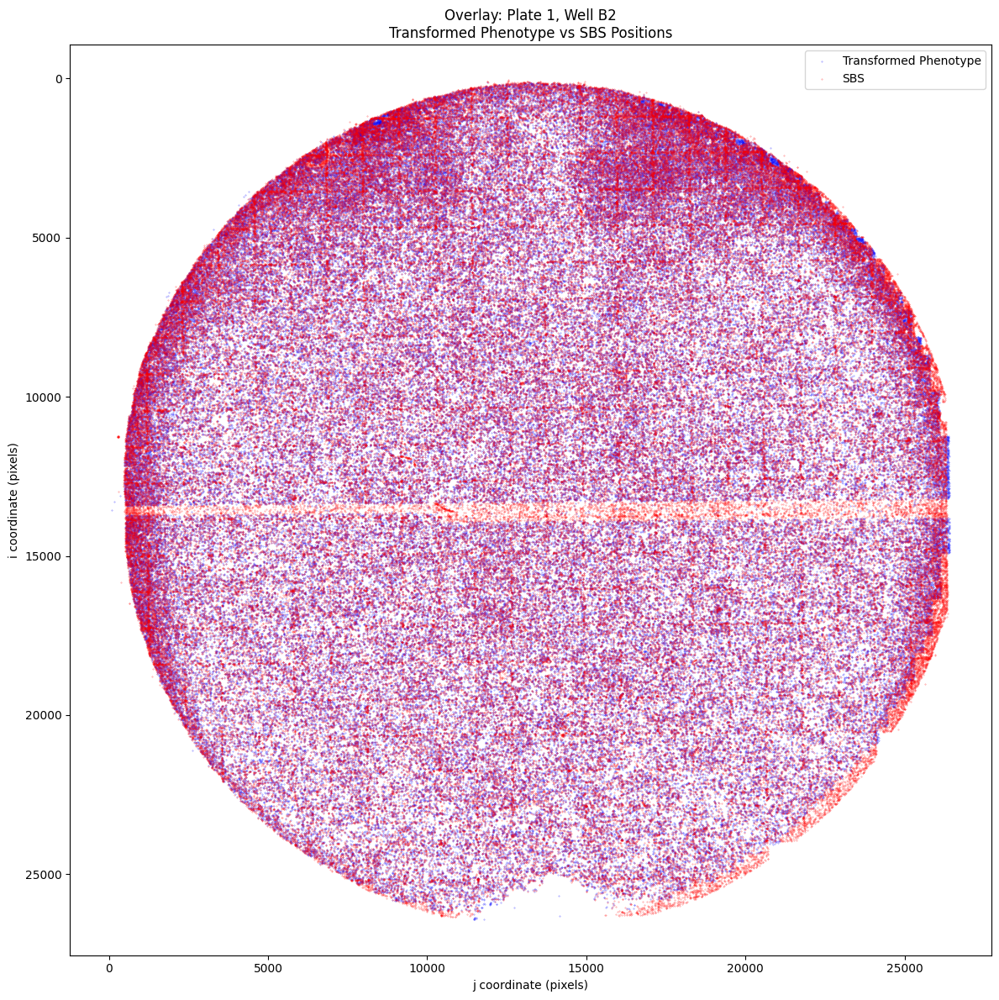

In [6]:
"""
Debug script to visualize phenotype and SBS cell positions after transformation
"""

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path

analysis_root = "/lab/ops_analysis/lourido/nebo-analysis/analysis/analysis_root/merge_1"
base_path = Path(analysis_root)

def create_overlay_visualization(plate, well, analysis_root="/lab/ops_analysis/lourido/nebo-analysis/analysis/analysis_root/merge_1", n_sample=50000):
    """
    Create visualization showing phenotype and SBS positions after transformation
    """
    base_path = Path(analysis_root)
    
    print(f"🔍 Creating overlay visualization for Plate {plate}, Well {well}")
    
    # Load transformed phenotype positions
    phenotype_transformed_path = base_path / "parquets" / f"P-{plate}_W-{well}__phenotype_transformed.parquet"
    phenotype_transformed = pd.read_parquet(phenotype_transformed_path)
    
    # Load SBS positions
    sbs_path = base_path / "parquets" / f"P-{plate}_W-{well}__sbs_cell_positions.parquet"
    sbs_positions = pd.read_parquet(sbs_path)
    
    print(f"  Transformed phenotype cells: {len(phenotype_transformed):,}")
    print(f"  SBS cells: {len(sbs_positions):,}")
    
    # Sample for plotting
    pheno_sample = phenotype_transformed.sample(min(n_sample, len(phenotype_transformed)), random_state=42)
    sbs_sample = sbs_positions.sample(min(n_sample, len(sbs_positions)), random_state=42)
    
    # Create figure
    fig, ax = plt.subplots(1, 1, figsize=(12, 12))
    
    # Plot both datasets with smaller points
    ax.scatter(pheno_sample['j'], pheno_sample['i'], alpha=0.5, s=0.1, c='blue', label='Transformed Phenotype')
    ax.scatter(sbs_sample['j'], sbs_sample['i'], alpha=0.5, s=0.1, c='red', label='SBS')
    
    ax.set_title(f'Overlay: Plate {plate}, Well {well}\nTransformed Phenotype vs SBS Positions')
    ax.set_xlabel('j coordinate (pixels)')
    ax.set_ylabel('i coordinate (pixels)')
    ax.invert_yaxis()
    ax.legend()
    ax.axis('equal')
    
    # Print coordinate ranges
    print(f"\n📍 Coordinate ranges:")
    print(f"  Transformed phenotype: i=[{pheno_sample['i'].min():.0f}, {pheno_sample['i'].max():.0f}], j=[{pheno_sample['j'].min():.0f}, {pheno_sample['j'].max():.0f}]")
    print(f"  SBS: i=[{sbs_sample['i'].min():.0f}, {sbs_sample['i'].max():.0f}], j=[{sbs_sample['j'].min():.0f}, {sbs_sample['j'].max():.0f}]")
    
    plt.tight_layout()
    
    # Save figure
    output_path = base_path / "debug_plots" / f"P-{plate}_W-{well}__overlay.png"
    output_path.parent.mkdir(exist_ok=True, parents=True)
    plt.savefig(output_path, dpi=150, bbox_inches='tight')
    print(f"\n✅ Figure saved to: {output_path}")
    
    plt.show()
    
    return fig

# Example usage
plate = "1"
well = "B2"

fig = create_overlay_visualization(plate, well, n_sample=200000)

In [19]:
merge = pd.read_parquet('/lab/ops_analysis/lourido/nebo-analysis/analysis/analysis_root/phenotype/parquets/P-1_W-A3__phenotype_cp_min.parquet')
display(merge)


,plate,well,tile,label,cell_i,cell_j,cell_bounds_0,cell_bounds_1,cell_bounds_2,cell_bounds_3,cell_DAPI_min,cell_ConA_min,cell_Stat6_min,cell_Mitotracker_min,cell_NHS_ester_min,cell_Tubulin_min,cell_WGA_min,cell_cMYC_min,cell_CDPK1_min
0,1,A3,0,1,72.468750,1110.281250,10,1020,160,1200,76,103,103,159,159,0,0,0,0
1,1,A3,0,2,71.728916,1427.150602,10,1360,170,1520,86,101,105,131,164,0,0,0,0
2,1,A3,0,3,114.738095,1306.960317,40,1230,180,1380,86,205,137,275,2640,97,250,100,94
3,1,A3,0,4,165.101093,995.319672,60,890,250,1090,78,99,99,137,118,98,134,88,83
4,1,A3,0,5,210.031915,2232.402736,130,2090,330,2380,86,91,92,134,222,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17,1,A3,6592,18,1804.884615,391.615385,1750,310,1860,480,93,100,97,133,97,67,95,83,78
18,1,A3,6592,19,2081.833333,53.166667,2030,10,2130,90,93,312,104,154,101,70,107,81,76
19,1,A3,6592,20,2137.027473,607.686813,2090,550,2180,670,84,164,105,150,103,71,101,83,80
0,1,A3,6661,1,1209.500000,320.906250,1150,240,1270,400,140,396,98,181,107,72,131,87,82


In [28]:
merge = pd.read_parquet('/lab/ops_analysis/lourido/nebo-analysis/analysis/analysis_root/merge/cell_positions/P-1_W-A3__phenotype_cell_positions.parquet')
display(merge)


,well,stitched_cell_id,i,j,area,data_type,cell,original_cell_id,original_tile_id,tile,tile_i,tile_j,mapping_method,stage_x,stage_y,tile_row,tile_col
0,A3,1,68.860031,119136.725117,7716.0,phenotype,1,1,0,0,68.860031,1311.725117,preserved_mapping,-37093.8,-37209.0,-1,-1
1,A3,2,73.887194,118795.311899,7278.0,phenotype,2,2,0,0,73.887194,970.311899,preserved_mapping,-37093.8,-37209.0,-1,-1
2,A3,3,95.499054,118925.812677,4228.0,phenotype,3,3,0,0,95.499054,1100.812677,preserved_mapping,-37093.8,-37209.0,-1,-1
3,A3,4,142.743371,119177.940647,4111.0,phenotype,4,4,0,0,142.743371,1352.940647,preserved_mapping,-37093.8,-37209.0,-1,-1
4,A3,5,215.580493,118027.189147,8274.0,phenotype,5,5,0,0,215.580493,202.189147,preserved_mapping,-37093.8,-37209.0,-1,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
138001,A3,138003,206048.158253,134224.401892,85003.0,phenotype,1,1,6745,6745,965.158253,1076.401892,preserved_mapping,-34603.9,-3882.9,-1,-1
138002,A3,138004,206810.292728,78322.525750,114680.0,phenotype,1,1,6770,6770,1270.292728,2172.525750,preserved_mapping,-43866.1,-3808.6,-1,-1
138003,A3,138005,211149.282758,114382.430764,557286.0,phenotype,1,1,6799,6799,1341.282758,1717.430764,preserved_mapping,-37932.3,-3115.1,-1,-1
138004,A3,138006,211717.123714,101449.686288,71811.0,phenotype,1,1,6804,6804,1818.123714,184.686288,preserved_mapping,-39784.8,-3100.4,-1,-1
